In [2]:
import pandas as pd
import numpy as np
import glob
import matplotlib.pyplot as plt
from tabulate import tabulate 

## Load data

In [3]:
# Define the folder path
folder_path = "../data/parameters/*.txt"

# List all .txt files in the folder
file_list = glob.glob(folder_path)

# Initialize an empty list to store DataFrames
df_list = []

# Loop through each file and process it
for file_path in file_list:
    print(f"Loading file: {file_path}")  # Print file name

    with open(file_path, "r") as file:
        lines = file.readlines()
    
    # Find the start of the actual table header
    data_start = next(i for i, line in enumerate(lines) if line.startswith("# Time"))
    
    # Extract column names (removing the "#" at the beginning)
    column_names = lines[data_start].strip("# ").strip().split("\t")
    
    # Read the data into a Pandas DataFrame
    df = pd.read_csv(
        file_path,
        sep="\t",
        skiprows=data_start + 1,
        names=column_names,
        na_values=["#N/A", "Disconnected"],
        low_memory=False  # Ensures Pandas processes the whole file before deciding column types
    )

    # Ensure 'Time' is in datetime format
    df["Time"] = pd.to_datetime(df["Time"], errors="coerce")

    # Convert numeric columns (all except 'Time') to float
    for col in df.columns:
        if col != "Time":
            df[col] = pd.to_numeric(df[col], errors="coerce")  # Convert, replacing errors with NaN

    # Append to list
    df_list.append(df)

    print(f"Loaded {len(df)} rows from {file_path}")  # Print number of rows loaded

# Concatenate all DataFrames, drop duplicates, and sort by time
parameters = pd.concat(df_list, ignore_index=True).drop_duplicates().sort_values(by="Time").reset_index(drop=True)

# Display the final merged DataFrame info
print(f"\nFinal merged DataFrame contains {len(parameters)} unique rows.")

Loading file: ../data/parameters/18_11.txt
Loaded 62986 rows from ../data/parameters/18_11.txt
Loading file: ../data/parameters/9_12.txt
Loaded 237808 rows from ../data/parameters/9_12.txt
Loading file: ../data/parameters/5_12.txt
Loaded 422217 rows from ../data/parameters/5_12.txt
Loading file: ../data/parameters/3_12.txt
Loaded 287850 rows from ../data/parameters/3_12.txt
Loading file: ../data/parameters/29_11.txt
Loaded 242422 rows from ../data/parameters/29_11.txt
Loading file: ../data/parameters/2_12.txt
Loaded 232201 rows from ../data/parameters/2_12.txt
Loading file: ../data/parameters/4_12.txt
Loaded 270574 rows from ../data/parameters/4_12.txt
Loading file: ../data/parameters/11_12.txt
Loaded 222147 rows from ../data/parameters/11_12.txt
Loading file: ../data/parameters/20_11.txt
Loaded 159935 rows from ../data/parameters/20_11.txt
Loading file: ../data/parameters/6_12.txt
Loaded 385687 rows from ../data/parameters/6_12.txt
Loading file: ../data/parameters/22_11.txt
Loaded 248

In [4]:
parameters.head()

,Time,L1-PL3-PZM52:Setpoint Value,L1-PL3-PZM53:Setpoint Value,L1-PL3-PZM56:Setpoint Value,L1-PL3-PZM57:Setpoint Value,L1-PL3-PZM58:Setpoint Value,L1-PL3-PZM59:Setpoint Value,L1-PL5-DIRA3:Piezo1_X_RB Value,L1-PL5-DIRA3:Piezo1_Y_RB Value,L1-PL5-DIRA3:Piezo3_X_RB Value,L1-PL5-DIRA3:Piezo3_Y_RB Value,L1-PL4-PZM66:Setpoint Value,L1-PL4-PZM67:Setpoint Value,L1-PL4-PZM68:Setpoint Value,L1-PL4-PZM69:Setpoint Value,L1-INJ-PM70:VAL_CAL Value,L1-OPA3-5_2-PM98:VAL_CAL Value
0,2024-11-14 18:01:24.490070820,NaN,0.589,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2024-11-14 18:01:24.585421085,0.1621,0.589,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2024-11-14 18:01:29.786182404,0.1621,0.589,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.9428,NaN,NaN,NaN,NaN
3,2024-11-14 18:01:46.486213207,0.1621,0.589,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.1545,-1.9428,NaN,NaN,NaN,NaN
4,2024-11-14 18:01:46.489224434,0.1621,0.589,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.1545,-1.9428,-2.6935,NaN,NaN,NaN


## Number of entries

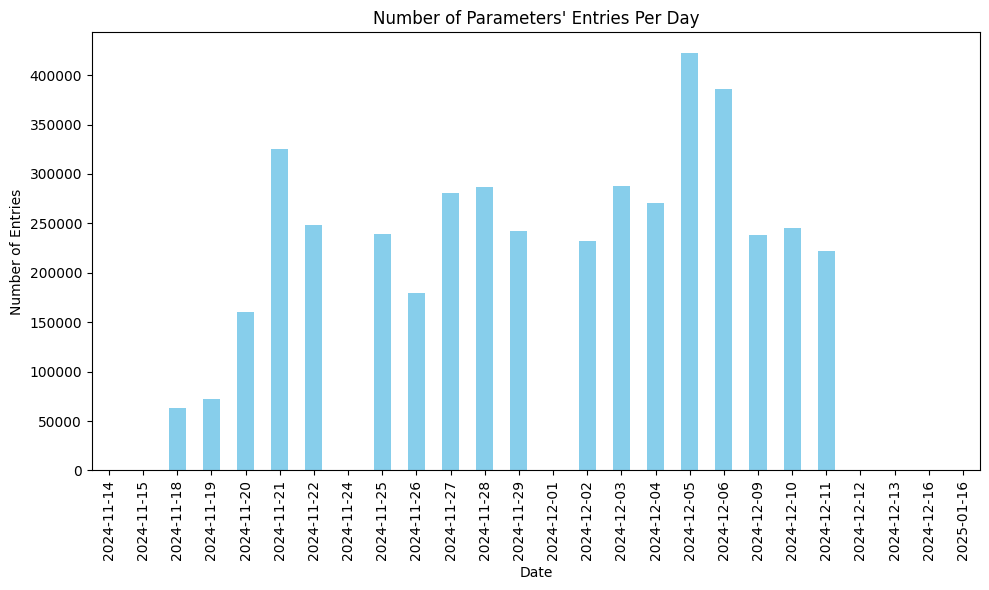

In [5]:
# Ensure that the 'Time' column is in datetime format (if not already)
parameters["Time"] = pd.to_datetime(parameters["Time"], errors="coerce")

# Group by day and count the samples per day
samples_per_day = parameters.groupby(parameters["Time"].dt.date).size()

# Plot the histogram
plt.figure(figsize=(10, 6))
samples_per_day.plot(kind="bar", color="skyblue")
plt.title("Number of Parameters' Entries Per Day")
plt.xlabel("Date")
plt.ylabel("Number of Entries")
#plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

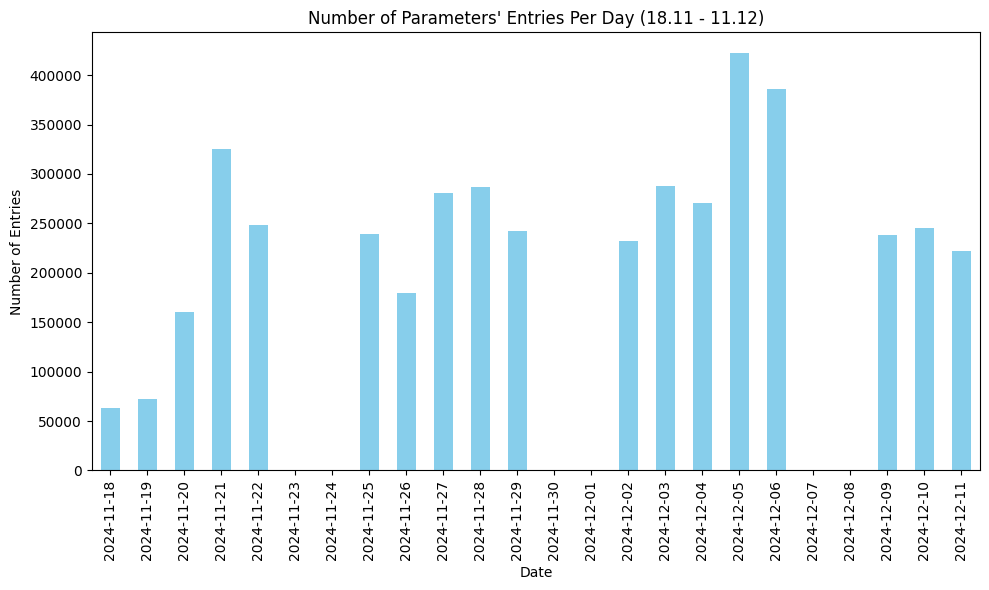

In [6]:
# Define the date range
start_date = pd.to_datetime("2024-11-18")
end_date = pd.to_datetime("2024-12-11")

# Group by day and count the samples per day
samples_per_day = parameters.groupby(parameters["Time"].dt.date).size()

# Create a full date range from 18.11 to 11.12 and ensure all dates are included
full_date_range = pd.date_range(start=start_date, end=end_date, freq="D")

# Reindex to ensure missing days are shown with 0 values
samples_per_day = samples_per_day.reindex(full_date_range, fill_value=0)

# Convert index to string format for clean x-axis labels
samples_per_day.index = samples_per_day.index.strftime("%Y-%m-%d")

# Plot the histogram
plt.figure(figsize=(10, 6))
samples_per_day.plot(kind="bar", color="skyblue")
plt.title("Number of Parameters' Entries Per Day (18.11 - 11.12)")
plt.xlabel("Date")
plt.ylabel("Number of Entries")
plt.tight_layout()
plt.show()

In [7]:
# Ensure 'Time' is in datetime format
parameters["Time"] = pd.to_datetime(parameters["Time"], errors="coerce")

# Get the full date range from the earliest to the latest date
full_date_range = pd.date_range(start=parameters["Time"].min().date(), end=parameters["Time"].max().date(), freq="D")

# Group by day and count the number of samples per day
samples_per_day = parameters.groupby(parameters["Time"].dt.date).size()

# Reindex to include all days, filling missing days with 0 samples
samples_per_day = samples_per_day.reindex(full_date_range, fill_value=0)

# Convert to DataFrame
samples_per_day_df = samples_per_day.reset_index()
samples_per_day_df.columns = ["Date", "Number of Entries"]

# Print the table in a readable format
print(tabulate(samples_per_day_df, headers="keys", tablefmt="pretty"))

+----+---------------------+-------------------+
|    |        Date         | Number of Entries |
+----+---------------------+-------------------+
| 0  | 2024-11-14 00:00:00 |        10         |
| 1  | 2024-11-15 00:00:00 |         4         |
| 2  | 2024-11-16 00:00:00 |         0         |
| 3  | 2024-11-17 00:00:00 |         0         |
| 4  | 2024-11-18 00:00:00 |       62972       |
| 5  | 2024-11-19 00:00:00 |       72129       |
| 6  | 2024-11-20 00:00:00 |      159942       |
| 7  | 2024-11-21 00:00:00 |      324943       |
| 8  | 2024-11-22 00:00:00 |      248266       |
| 9  | 2024-11-23 00:00:00 |         0         |
| 10 | 2024-11-24 00:00:00 |         6         |
| 11 | 2024-11-25 00:00:00 |      239196       |
| 12 | 2024-11-26 00:00:00 |      179476       |
| 13 | 2024-11-27 00:00:00 |      280914       |
| 14 | 2024-11-28 00:00:00 |      287203       |
| 15 | 2024-11-29 00:00:00 |      242403       |
| 16 | 2024-11-30 00:00:00 |         0         |
| 17 | 2024-12-01 00

## Statistics

In [8]:
parameters.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4400797 entries, 0 to 4400796
Data columns (total 17 columns):
 #   Column                          Dtype         
---  ------                          -----         
 0   Time                            datetime64[ns]
 1   L1-PL3-PZM52:Setpoint Value     float64       
 2   L1-PL3-PZM53:Setpoint Value     float64       
 3   L1-PL3-PZM56:Setpoint Value     float64       
 4   L1-PL3-PZM57:Setpoint Value     float64       
 5   L1-PL3-PZM58:Setpoint Value     float64       
 6   L1-PL3-PZM59:Setpoint Value     float64       
 7   L1-PL5-DIRA3:Piezo1_X_RB Value  float64       
 8   L1-PL5-DIRA3:Piezo1_Y_RB Value  float64       
 9   L1-PL5-DIRA3:Piezo3_X_RB Value  float64       
 10  L1-PL5-DIRA3:Piezo3_Y_RB Value  float64       
 11  L1-PL4-PZM66:Setpoint Value     float64       
 12  L1-PL4-PZM67:Setpoint Value     float64       
 13  L1-PL4-PZM68:Setpoint Value     float64       
 14  L1-PL4-PZM69:Setpoint Value     float64       
 15

In [9]:
shortened_names = {col: col.split(" ")[0] for col in parameters.columns}
parameters.rename(columns=shortened_names, inplace=True)
parameters.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4400797 entries, 0 to 4400796
Data columns (total 17 columns):
 #   Column                    Dtype         
---  ------                    -----         
 0   Time                      datetime64[ns]
 1   L1-PL3-PZM52:Setpoint     float64       
 2   L1-PL3-PZM53:Setpoint     float64       
 3   L1-PL3-PZM56:Setpoint     float64       
 4   L1-PL3-PZM57:Setpoint     float64       
 5   L1-PL3-PZM58:Setpoint     float64       
 6   L1-PL3-PZM59:Setpoint     float64       
 7   L1-PL5-DIRA3:Piezo1_X_RB  float64       
 8   L1-PL5-DIRA3:Piezo1_Y_RB  float64       
 9   L1-PL5-DIRA3:Piezo3_X_RB  float64       
 10  L1-PL5-DIRA3:Piezo3_Y_RB  float64       
 11  L1-PL4-PZM66:Setpoint     float64       
 12  L1-PL4-PZM67:Setpoint     float64       
 13  L1-PL4-PZM68:Setpoint     float64       
 14  L1-PL4-PZM69:Setpoint     float64       
 15  L1-INJ-PM70:VAL_CAL       float64       
 16  L1-OPA3-5_2-PM98:VAL_CAL  float64       
dtypes: datet

# Piezo

In [31]:
start_date = pd.to_datetime("2024-11-18")
end_date = pd.to_datetime("2024-12-11")

# Get all unique dates and exclude the specified ones
excluded_dates = {
    "2024-12-08", "2024-12-07", "2024-12-01", 
    "2024-11-30", "2024-11-24", "2024-11-23"
}

# List of parameters to plot
parameters_to_plot = [
    "L1-PL3-PZM52:Setpoint", "L1-PL3-PZM53:Setpoint", "L1-PL3-PZM56:Setpoint", 
    "L1-PL3-PZM57:Setpoint", "L1-PL3-PZM58:Setpoint", "L1-PL3-PZM59:Setpoint",
    "L1-PL5-DIRA3:Piezo1_X_RB", "L1-PL5-DIRA3:Piezo1_Y_RB", 
    "L1-PL5-DIRA3:Piezo3_X_RB", "L1-PL5-DIRA3:Piezo3_Y_RB",
    "L1-PL4-PZM66:Setpoint", "L1-PL4-PZM67:Setpoint",
    "L1-PL4-PZM68:Setpoint", "L1-PL4-PZM69:Setpoint"
]

In [32]:
colors = plt.cm.get_cmap('tab20', len(parameters_to_plot)).colors

filtered_data = parameters[(parameters["Time"].dt.date >= start_date.date()) & 
                           (parameters["Time"].dt.date <= end_date.date())]

unique_dates = [d for d in pd.date_range(start=start_date, end=end_date, freq="D") 
                if d.strftime('%Y-%m-%d') not in excluded_dates]

/tmp/ipykernel_2496981/13556297.py:1: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab20', len(parameters_to_plot)).colors


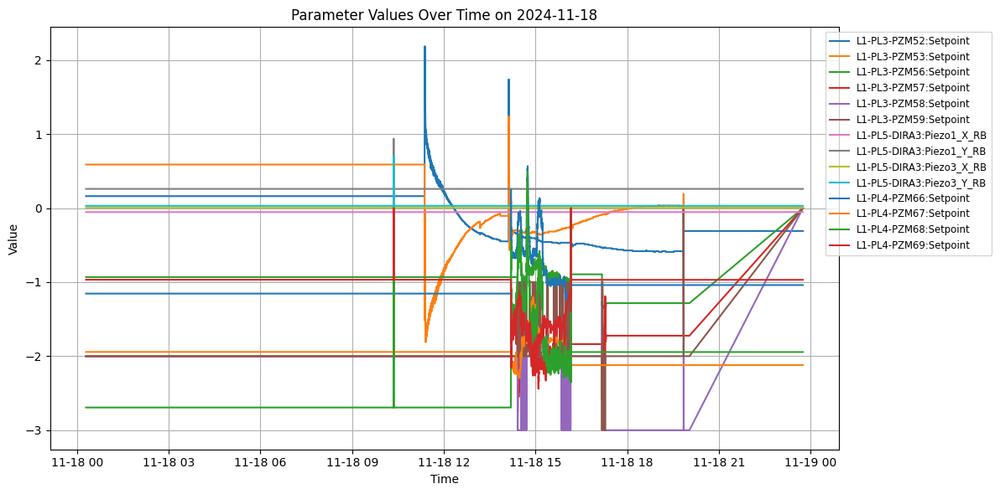

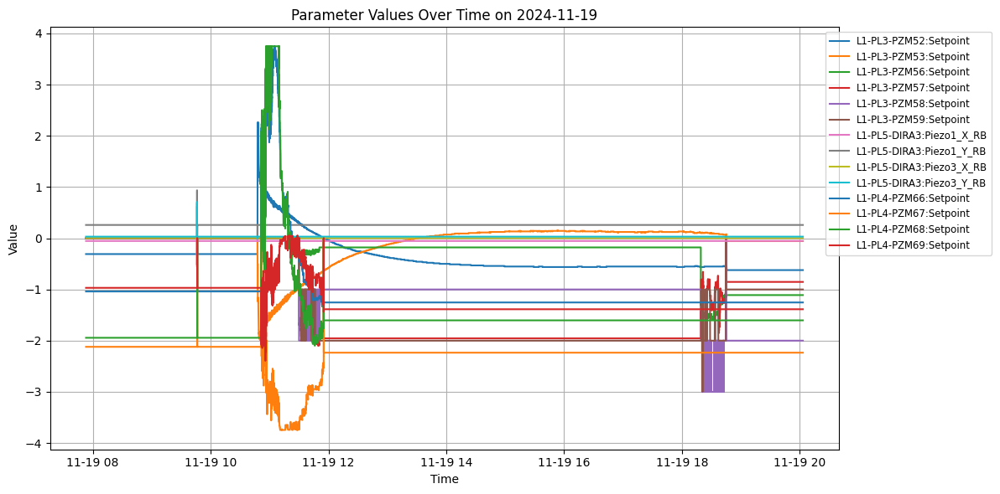

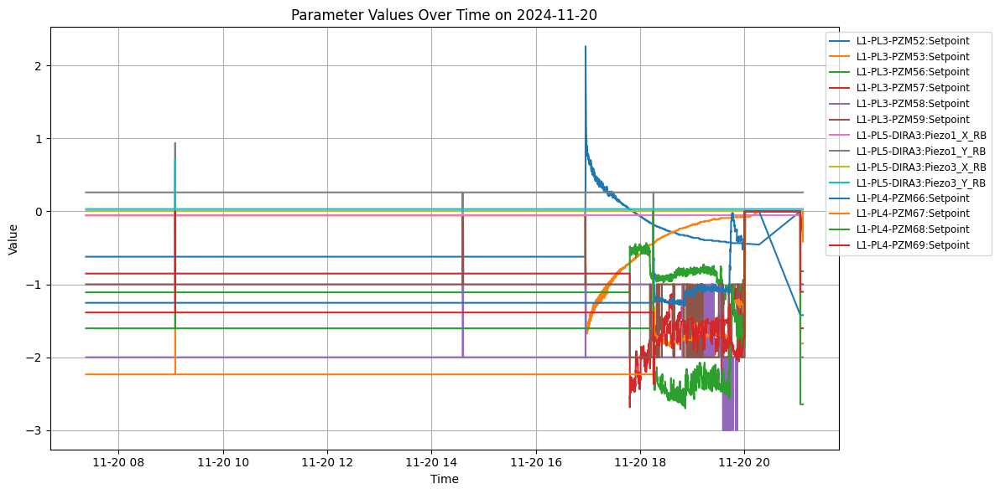

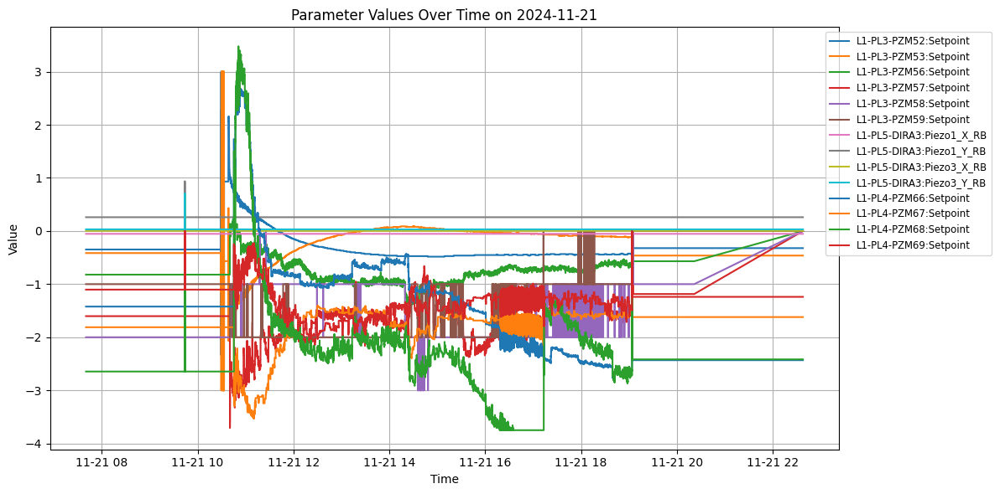

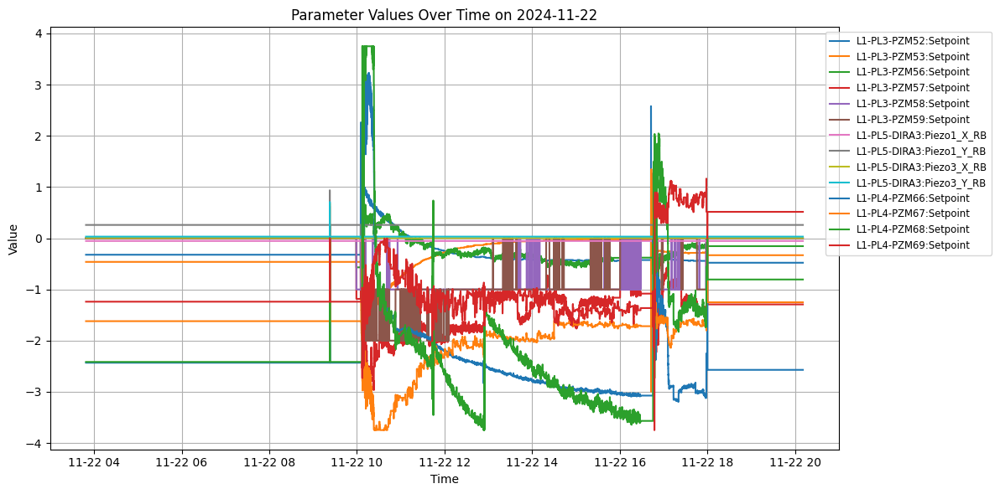

...

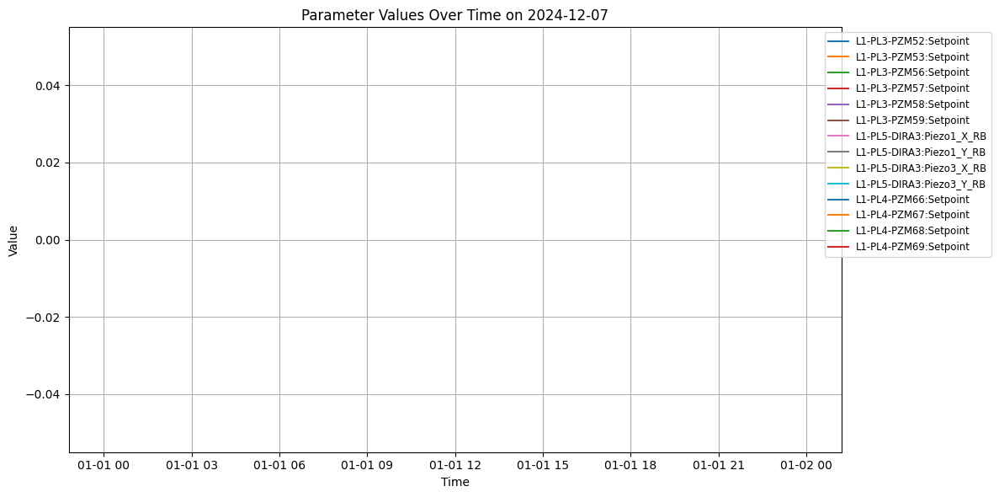

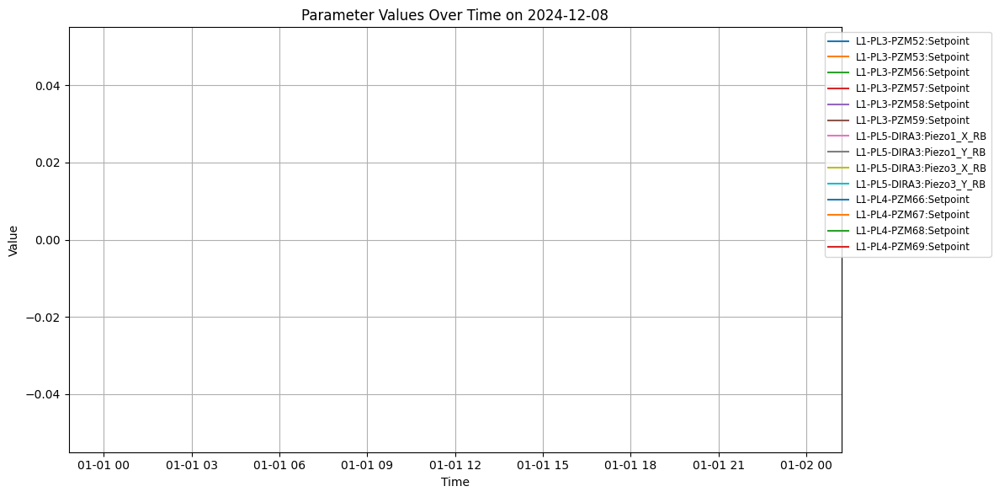

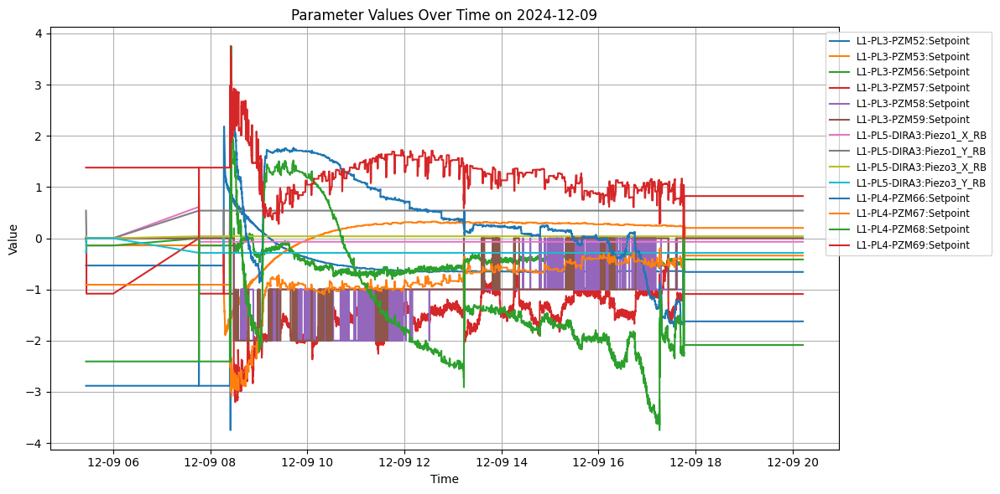

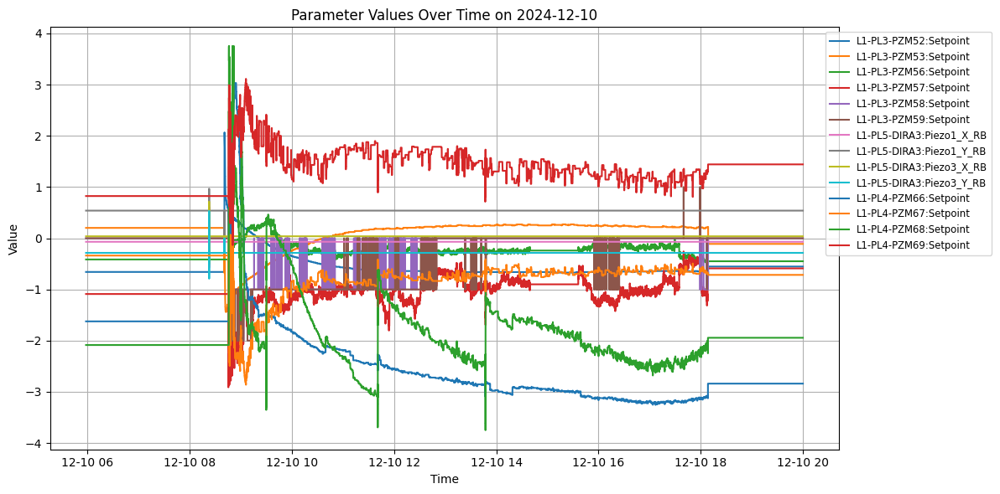

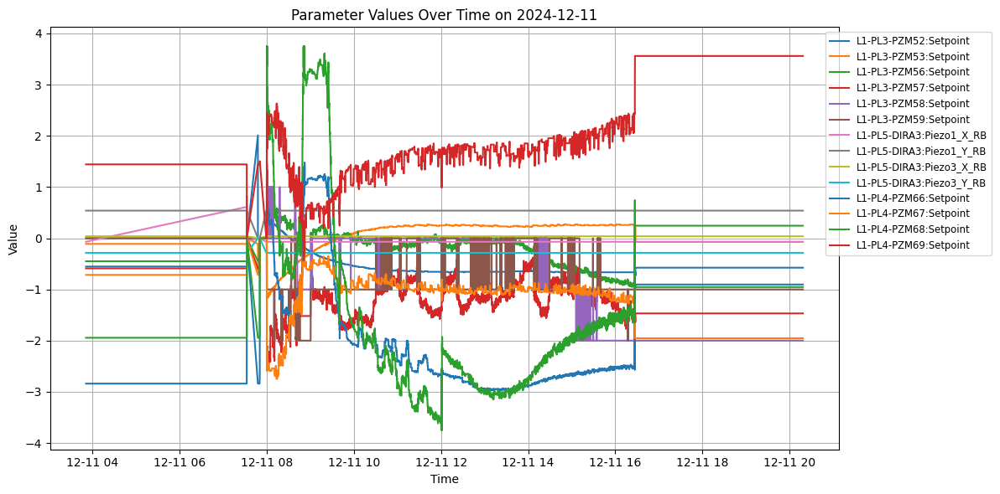

In [33]:
for date in pd.date_range(start=start_date, end=end_date, freq="D"):

    daily_data = filtered_data[filtered_data["Time"].dt.date == date.date()]
    
    daily_data_clean = daily_data.copy()
    daily_data_clean[parameters_to_plot] = daily_data_clean[parameters_to_plot].fillna(0)

    plt.figure(figsize=(12, 6))
    
    for param in parameters_to_plot:
        plt.plot(daily_data_clean["Time"], daily_data_clean[param], linestyle='-', label=param)

    plt.title(f"Parameter Values Over Time on {date.strftime('%Y-%m-%d')}")
    plt.xlabel("Time")
    plt.ylabel("Value")
    plt.legend(loc="upper right", fontsize="small", bbox_to_anchor=(1.2, 1))
    plt.grid(True)
    plt.tight_layout()
    plt.show()

/tmp/ipykernel_2496981/849024421.py:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab20', len(parameters_to_plot)).colors


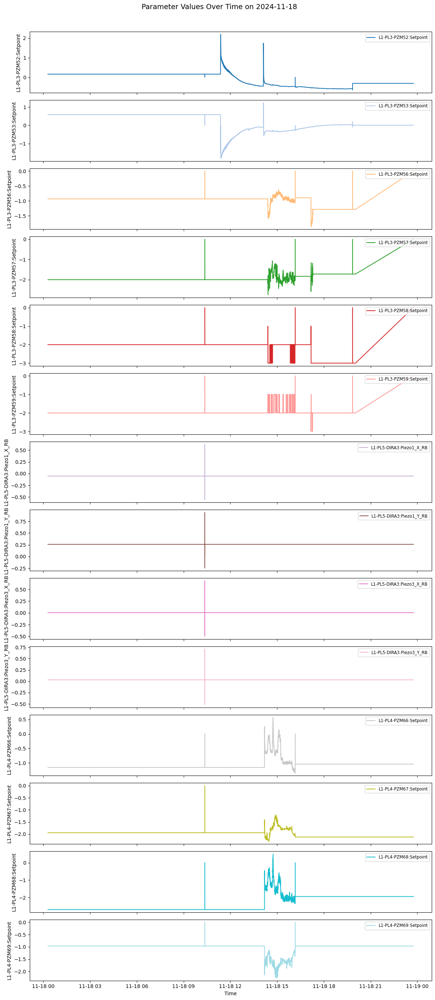

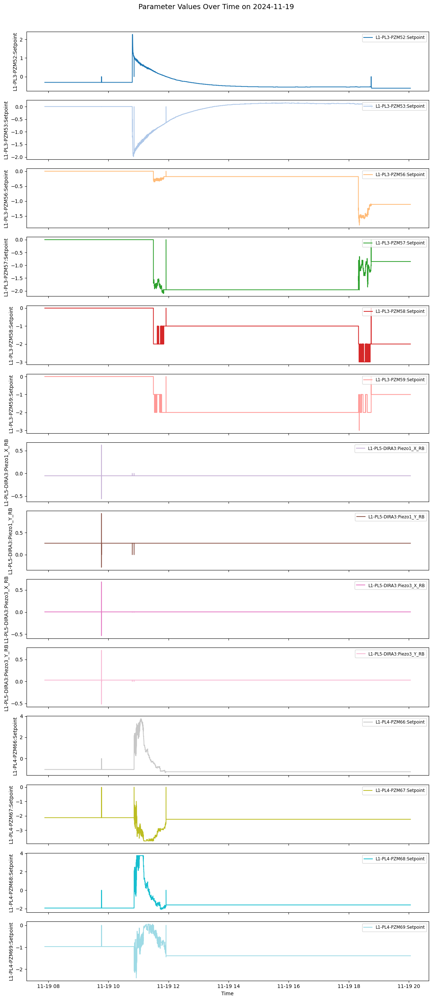

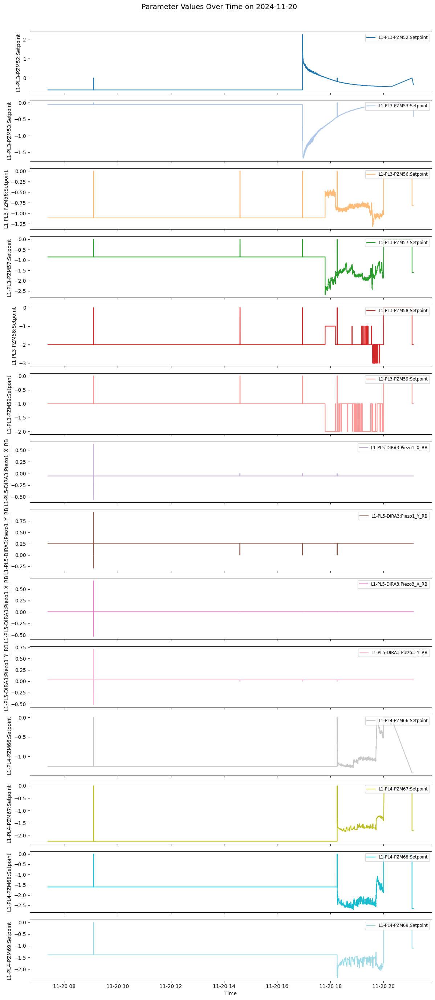

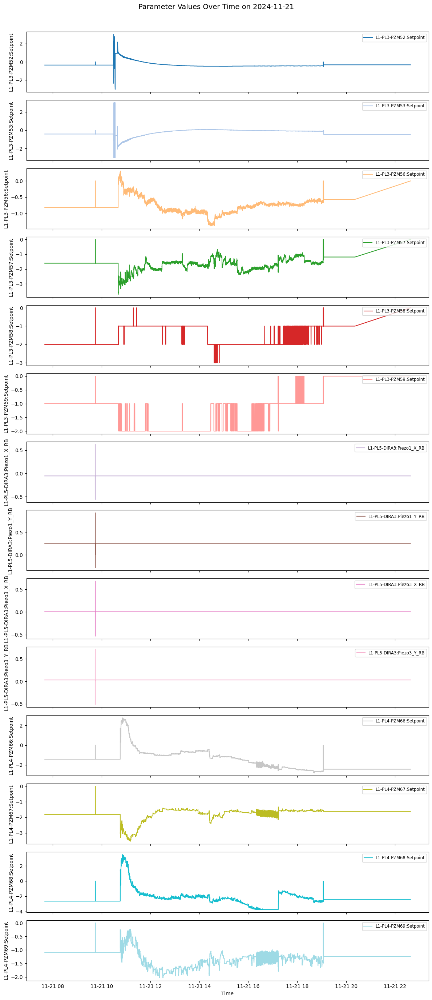

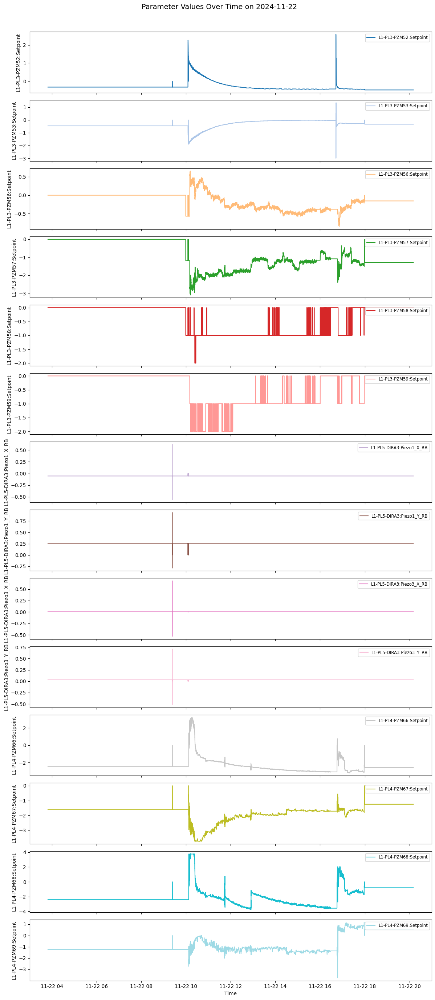

...

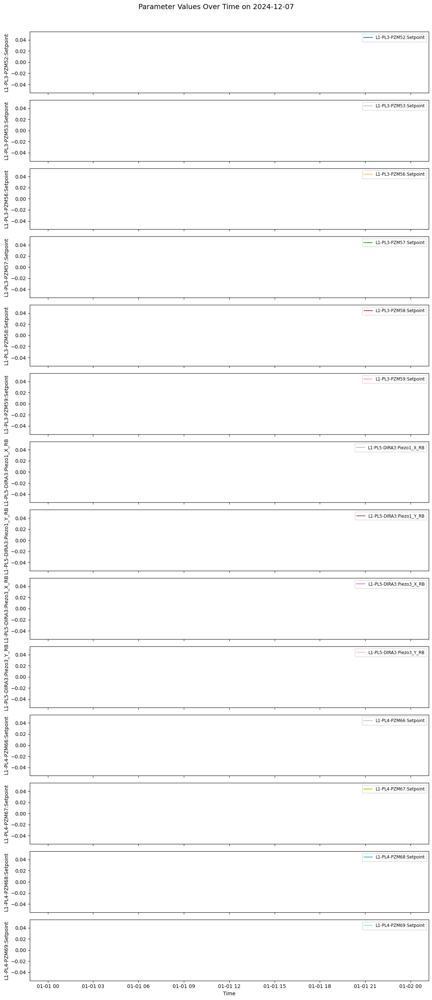

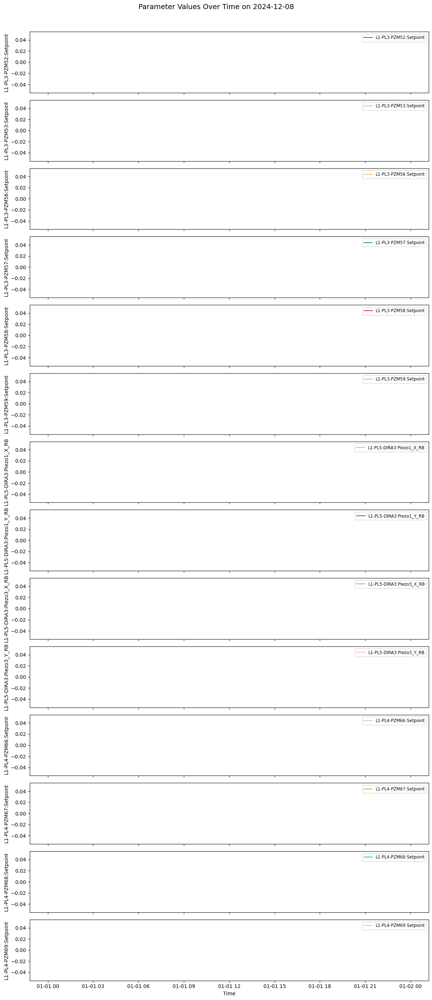

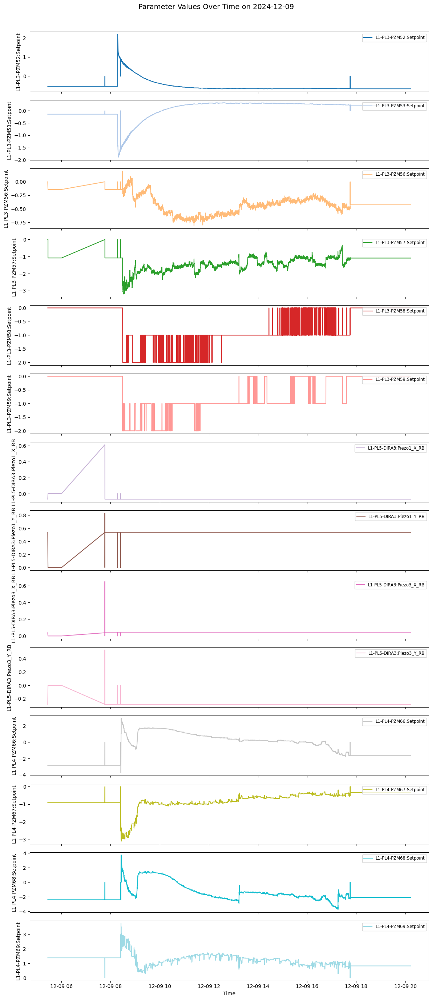

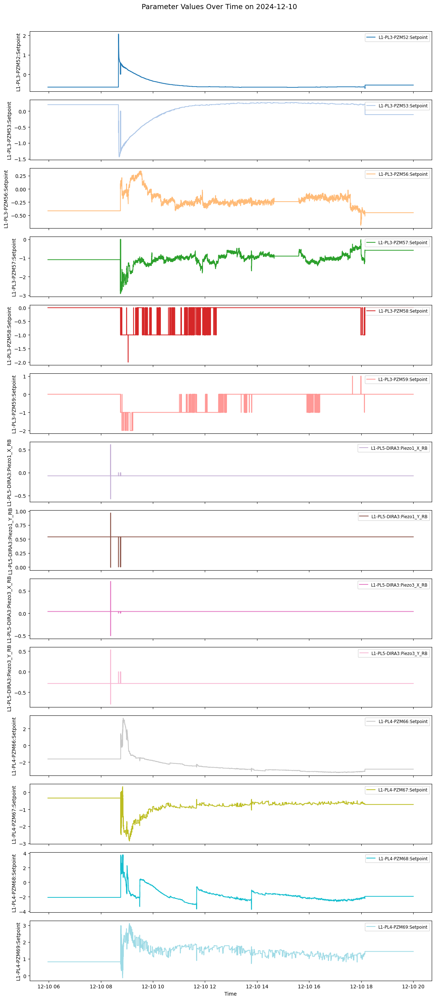

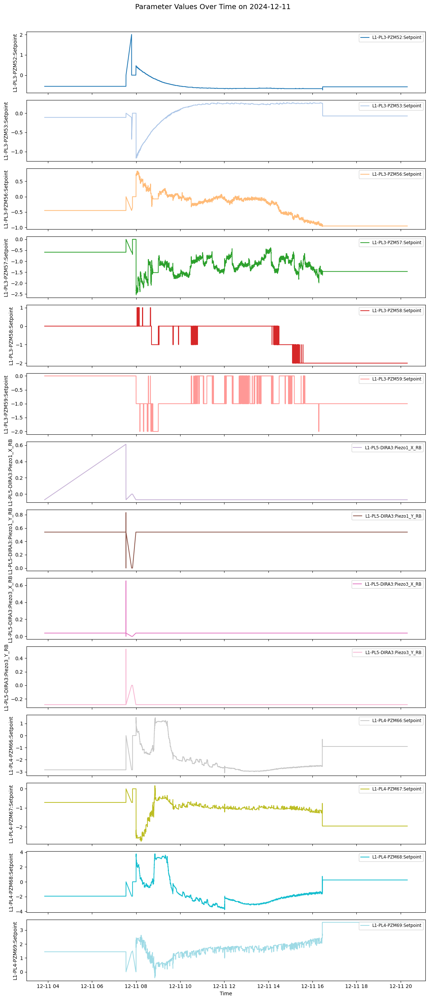

In [18]:
for date in pd.date_range(start=start_date, end=end_date, freq="D"):
    daily_data = filtered_data[filtered_data["Time"].dt.date == date.date()]
    
    # Replace NaN values with 0 in a copy of the daily data
    daily_data_clean = daily_data.copy()
    daily_data_clean[parameters_to_plot] = daily_data_clean[parameters_to_plot].fillna(0)

    fig, axes = plt.subplots(nrows=14, ncols=1, figsize=(12, 28), sharex=True)

    for i, param in enumerate(parameters_to_plot):
        axes[i].plot(daily_data_clean["Time"], daily_data_clean[param], linestyle='-', 
                     label=param, color=colors[i])
        axes[i].set_ylabel(param, fontsize=10)
        axes[i].legend(loc="upper right", fontsize="small")

    plt.suptitle(f"Parameter Values Over Time on {date.strftime('%Y-%m-%d')}", fontsize=14)
    axes[-1].set_xlabel("Time")
    plt.tight_layout(rect=[0, 0, 1, 0.97])

    plt.show()

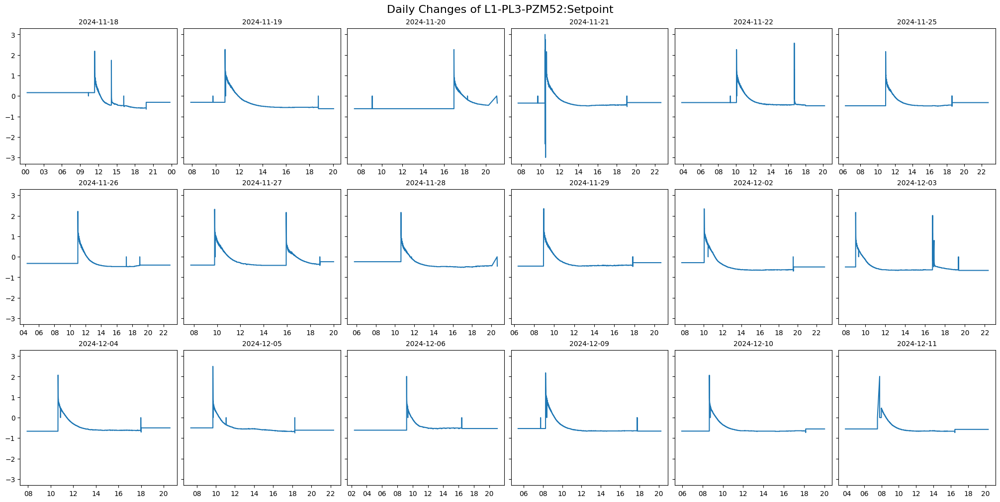

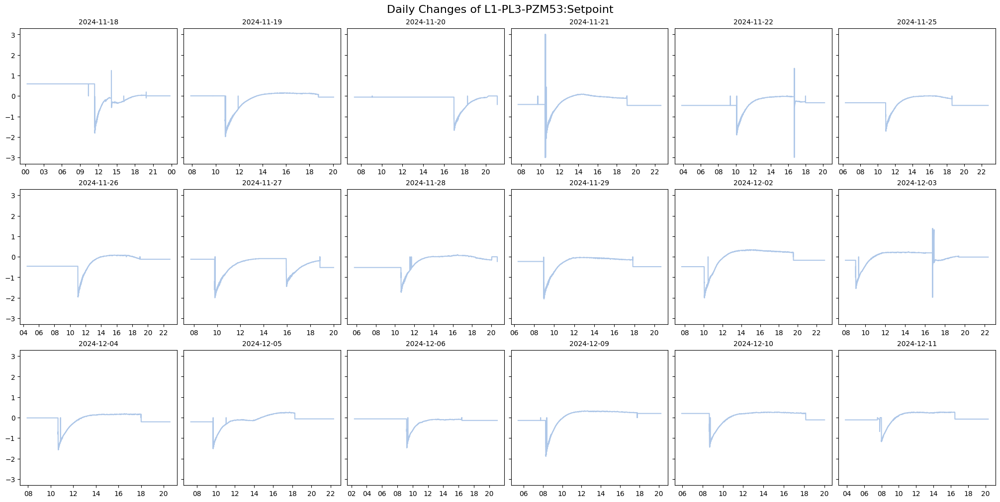

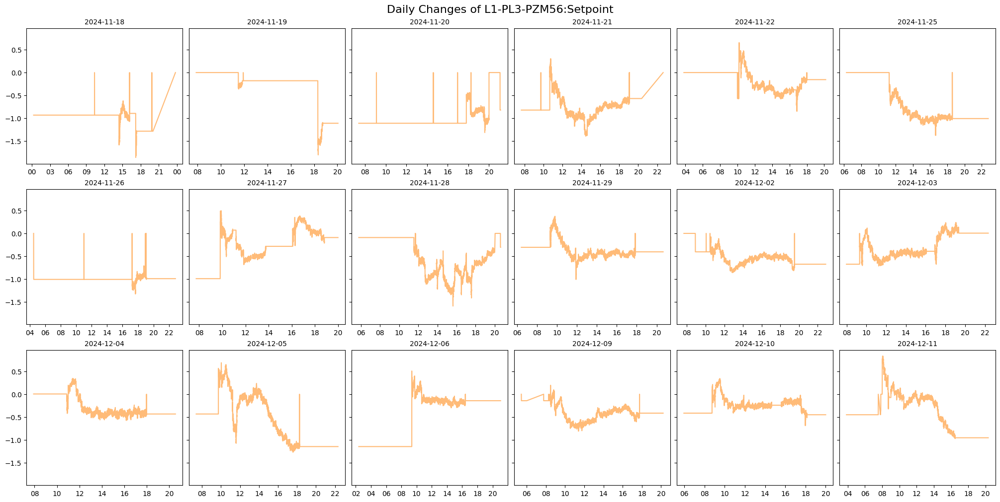

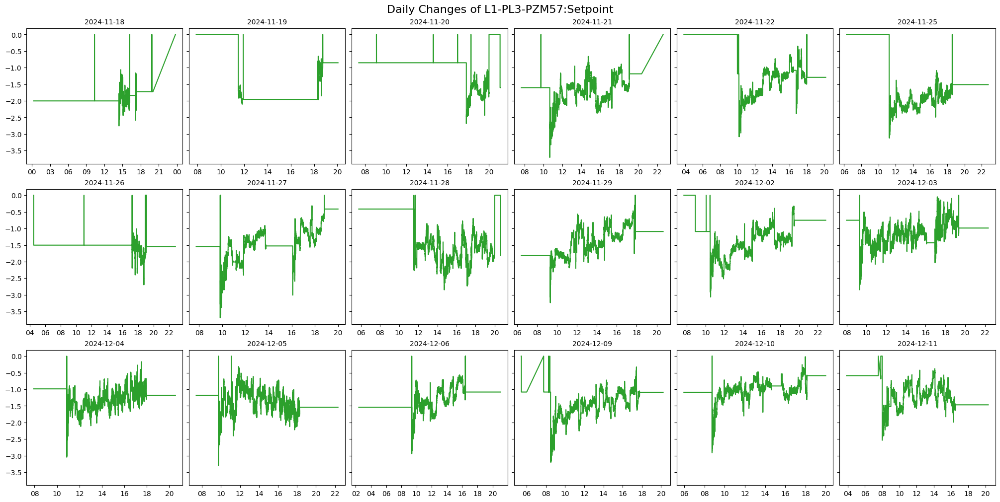

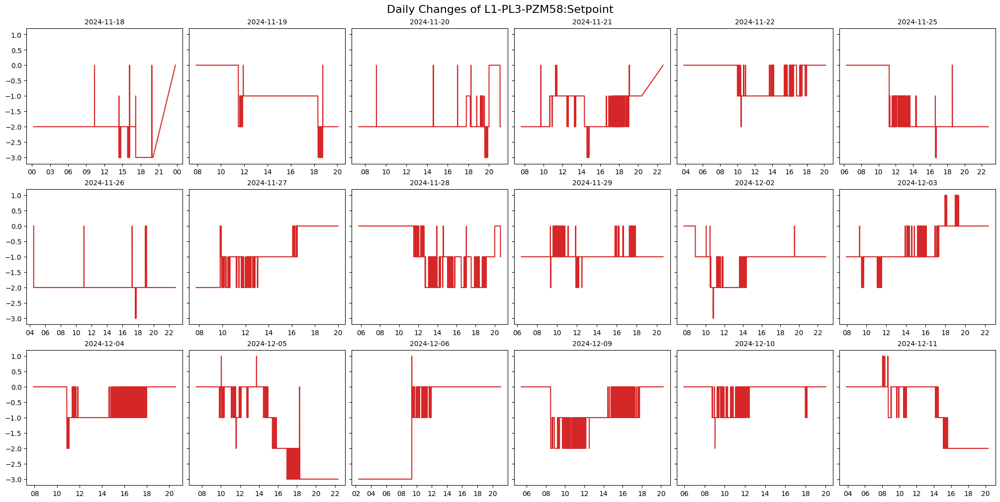

...

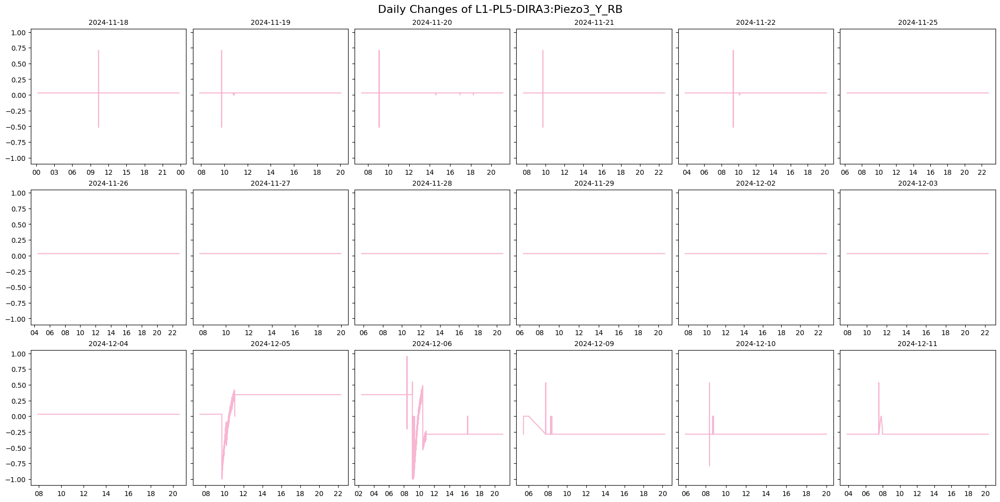

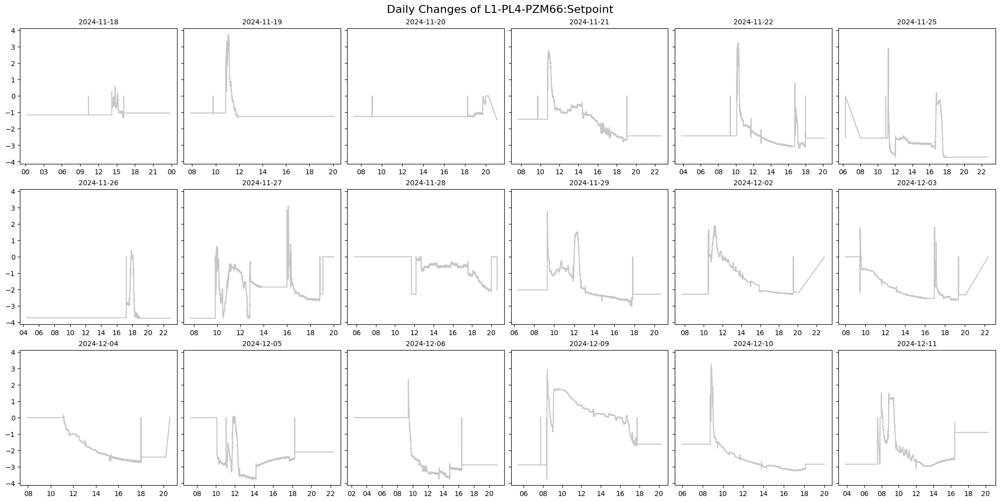

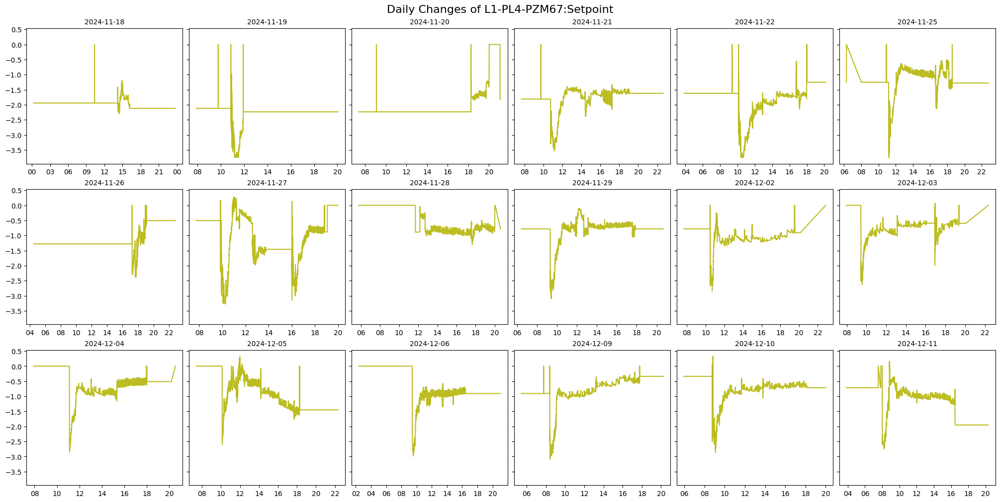

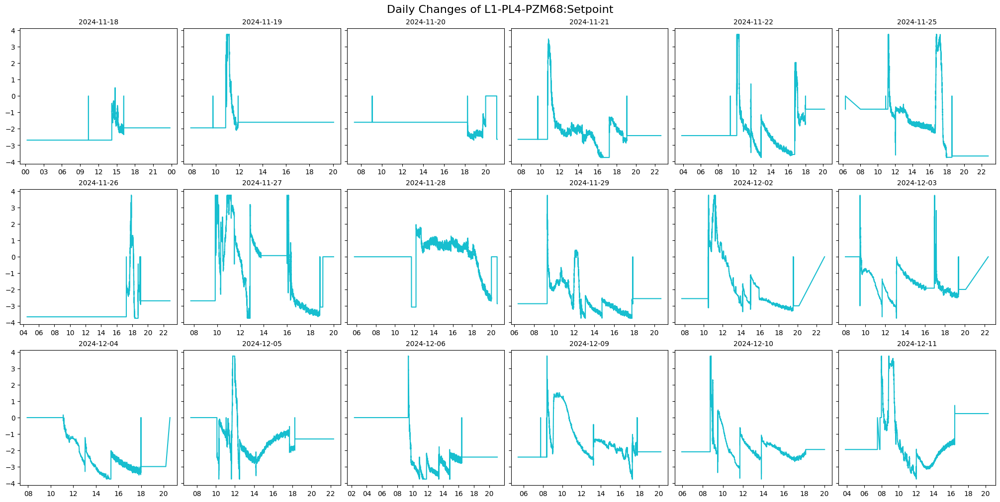

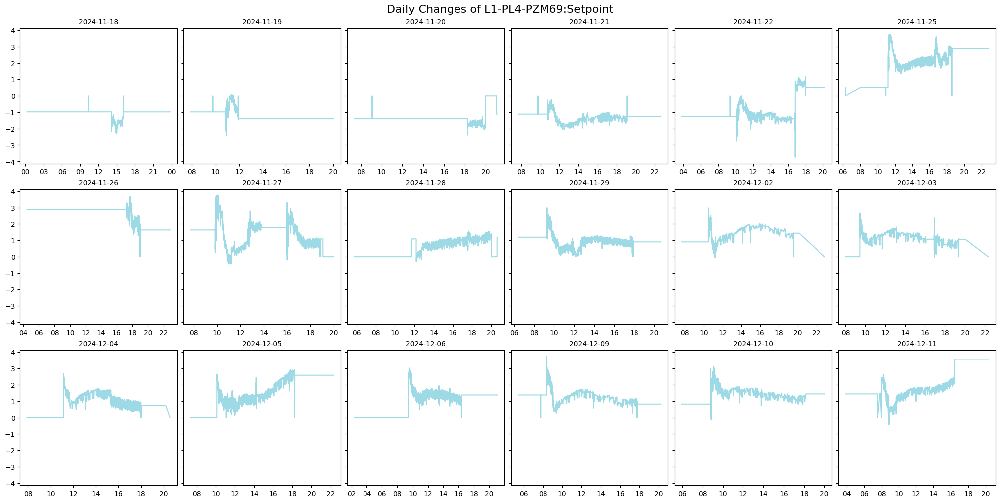

In [49]:
n_rows, n_cols = 3, 6

for param_idx, param in enumerate(parameters_to_plot):
    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(20, 10), sharey=True, constrained_layout=True)
    axes = axes.flatten() 
    
    for day_idx, date in enumerate(unique_dates):
        if day_idx >= len(axes):
            break 

        daily_data = filtered_data[filtered_data["Time"].dt.date == date.date()]
        
        daily_data_clean = daily_data.copy()
        daily_data_clean[param] = daily_data_clean[param].fillna(0)

        axes[day_idx].plot(daily_data_clean["Time"], daily_data_clean[param], linestyle='-', 
                           color=colors[param_idx], label=f"{param}")

        axes[day_idx].set_title(date.strftime('%Y-%m-%d'), fontsize=10)
        axes[day_idx].xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter('%H'))
        axes[day_idx].tick_params(axis='x', rotation=0)

    for extra_idx in range(len(unique_dates), len(axes)):
        fig.delaxes(axes[extra_idx])

    plt.suptitle(f"Daily Changes of {param}", fontsize=16)  
    plt.show()

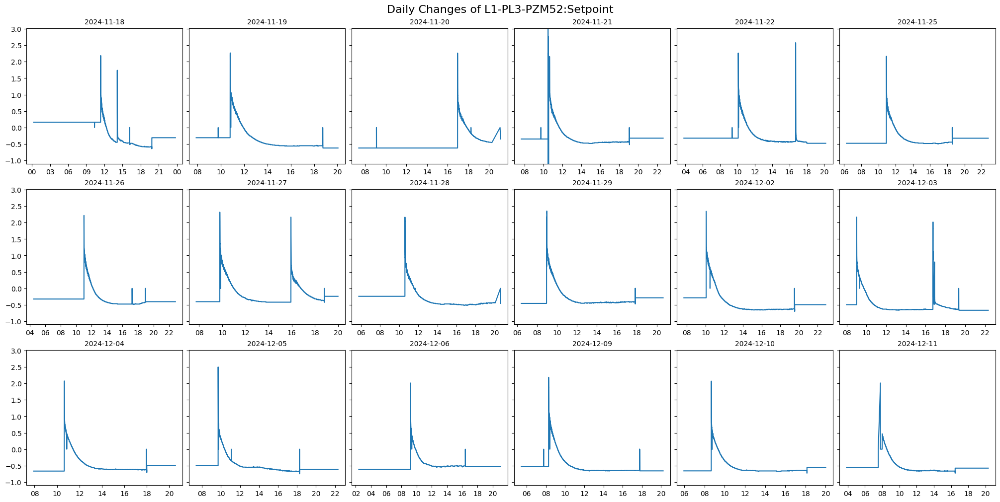

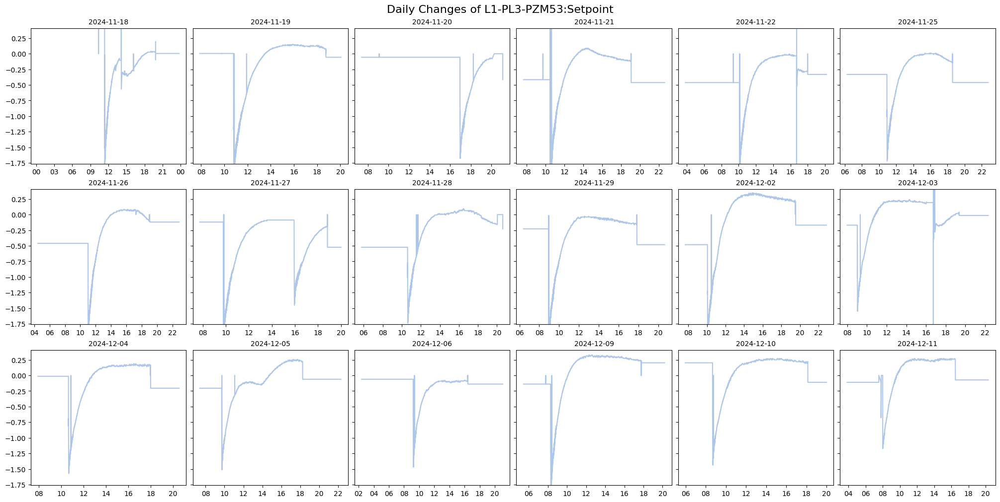

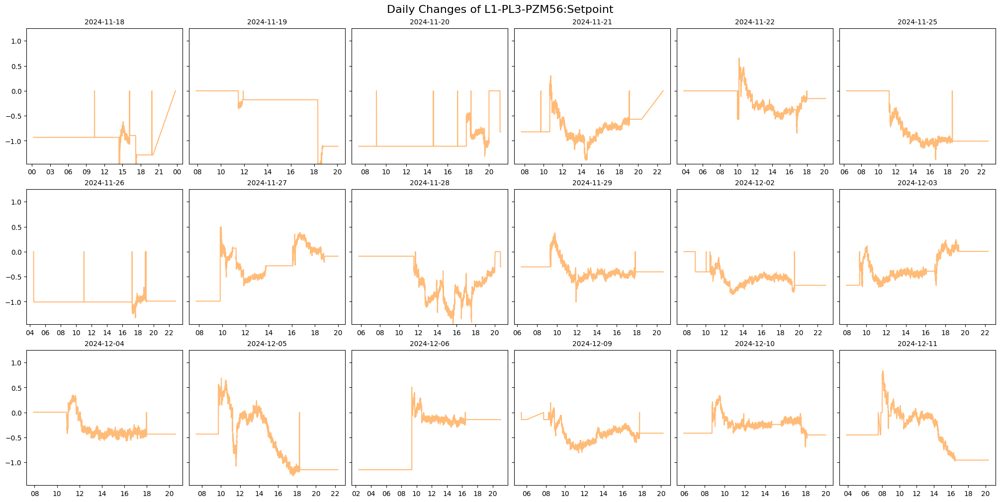

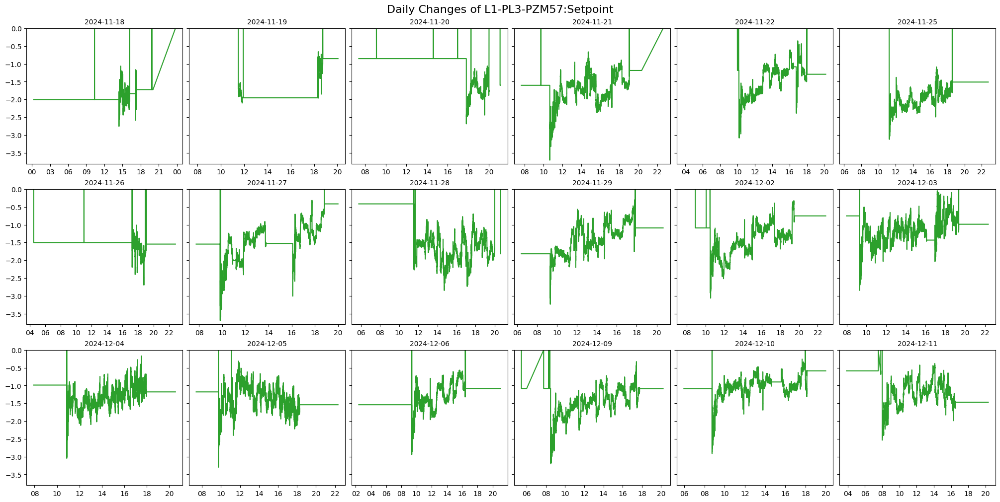

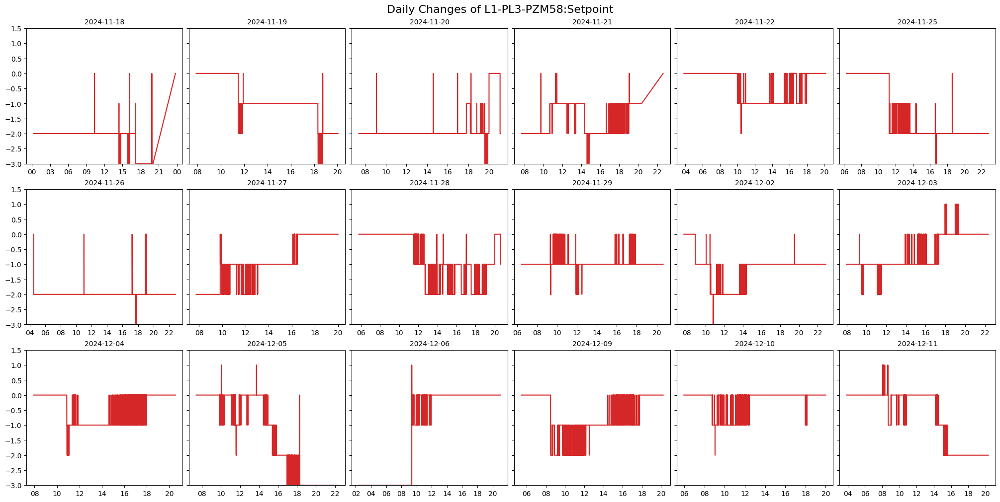

...

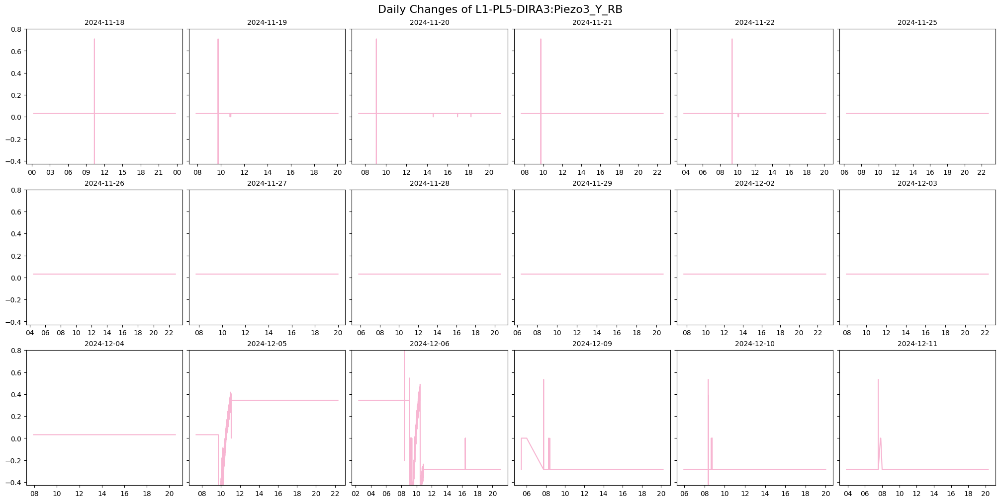

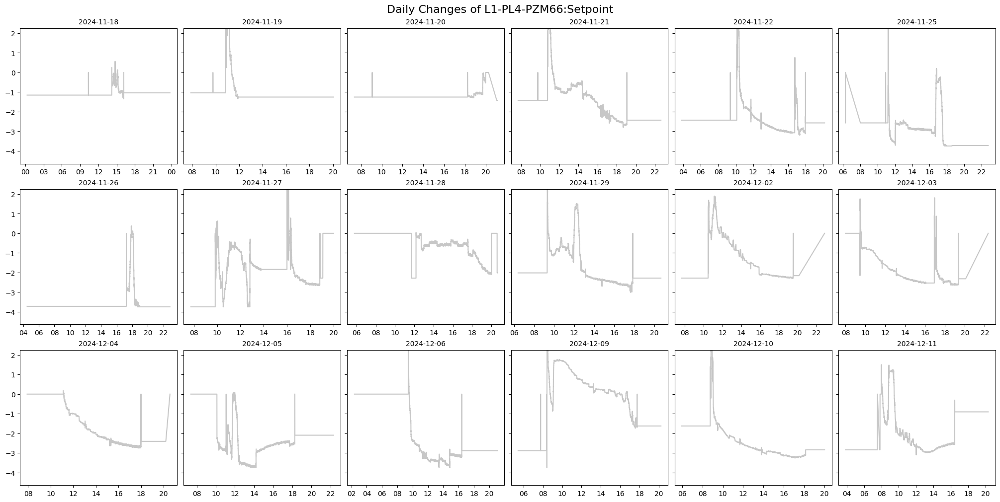

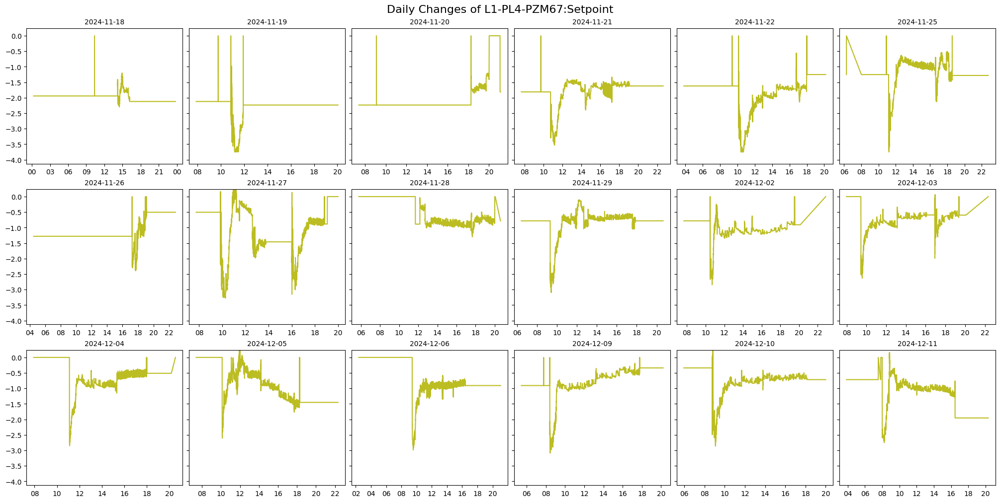

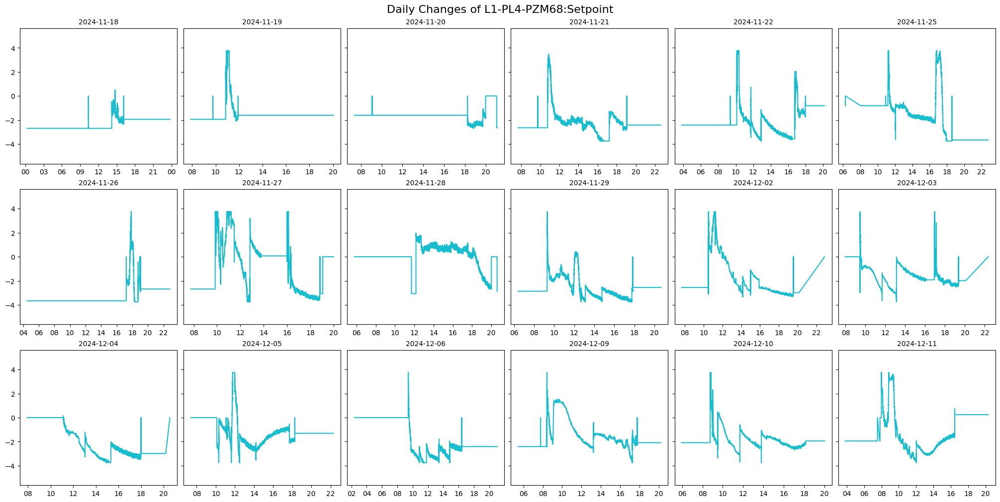

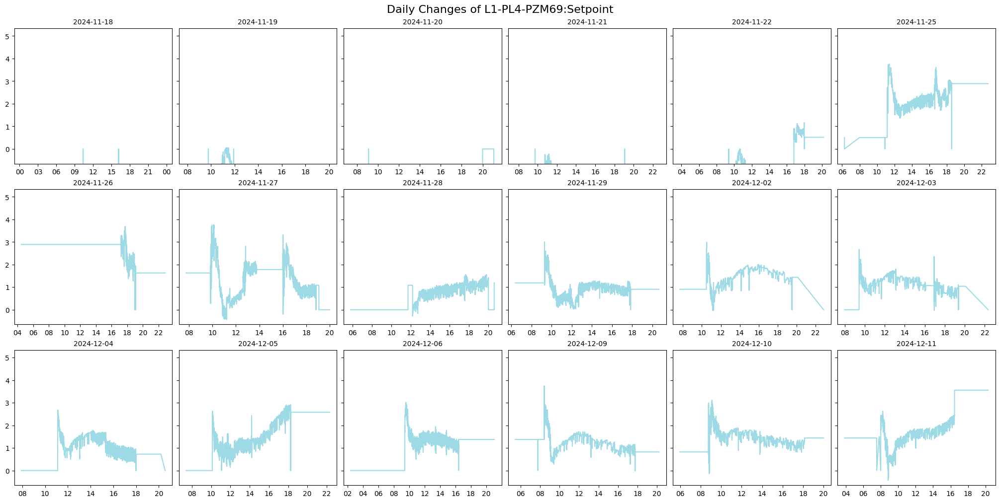

In [48]:
n_rows, n_cols = 3, 6

for param_idx, param in enumerate(parameters_to_plot):
    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(20, 10), sharey=True, constrained_layout=True)
    axes = axes.flatten() 
    
    for day_idx, date in enumerate(unique_dates):
        if day_idx >= len(axes):
            break 

        daily_data = filtered_data[filtered_data["Time"].dt.date == date.date()]
        
        daily_data_clean = daily_data.copy()
        daily_data_clean[param] = daily_data_clean[param].fillna(0)

        axes[day_idx].plot(daily_data_clean["Time"], daily_data_clean[param], linestyle='-', 
                           color=colors[param_idx], label=f"{param}")

        axes[day_idx].set_title(date.strftime('%Y-%m-%d'), fontsize=10)
        axes[day_idx].xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter('%H'))
        axes[day_idx].tick_params(axis='x', rotation=0)

        if not daily_data_clean[param].empty:
            min_val = daily_data_clean[param].min()
            min_val = min_val - abs(min_val*0.5)
            max_val = daily_data_clean[param].max()
            max_val = max_val + abs(max_val*0.5)
            axes[day_idx].set_ylim(min_val, max_val)

    for extra_idx in range(len(unique_dates), len(axes)):
        fig.delaxes(axes[extra_idx])

    plt.suptitle(f"Daily Changes of {param}", fontsize=16)  
    plt.show()

# Powermeter and Photodiode

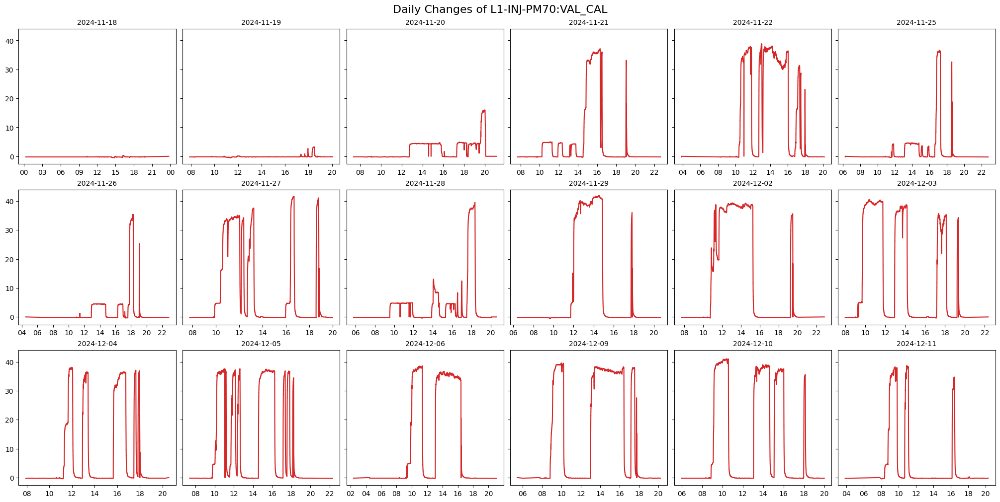

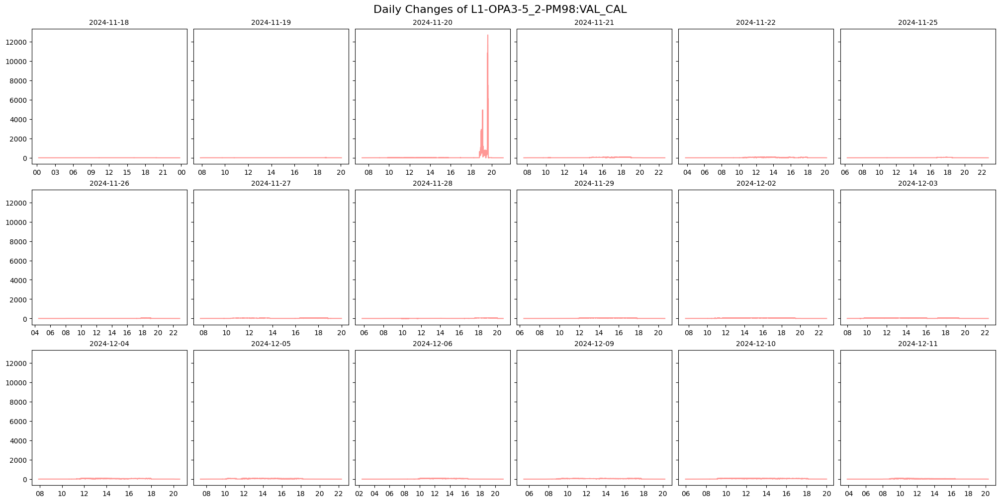

In [37]:
parameters_to_plot_1 = [
    "L1-INJ-PM70:VAL_CAL",
    "L1-OPA3-5_2-PM98:VAL_CAL"
]
n_rows, n_cols = 3, 6
for param_idx, param in enumerate(parameters_to_plot_1):
    fig, axes = plt.subplots(nrows=n_rows, 
                             ncols=n_cols, 
                             figsize=(20, 10), 
                             sharey=True, 
                             constrained_layout=True)
    axes = axes.flatten()  
    
    for day_idx, date in enumerate(unique_dates):
        if day_idx >= len(axes):
            break

        daily_data = filtered_data[filtered_data["Time"].dt.date == date.date()]
        
        daily_data_clean = daily_data.copy()
        daily_data_clean[param] = daily_data_clean[param].fillna(0)

        axes[day_idx].plot(daily_data_clean["Time"], daily_data_clean[param], linestyle='-', 
                           color=colors[param_idx+4], label=f"{param}")

        axes[day_idx].set_title(date.strftime('%Y-%m-%d'), fontsize=10)
        axes[day_idx].xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter('%H')) 
        axes[day_idx].tick_params(axis='x', rotation=0)  

    for extra_idx in range(len(unique_dates), len(axes)):
        fig.delaxes(axes[extra_idx])

    plt.suptitle(f"Daily Changes of {param}", fontsize=16)  
    plt.show()

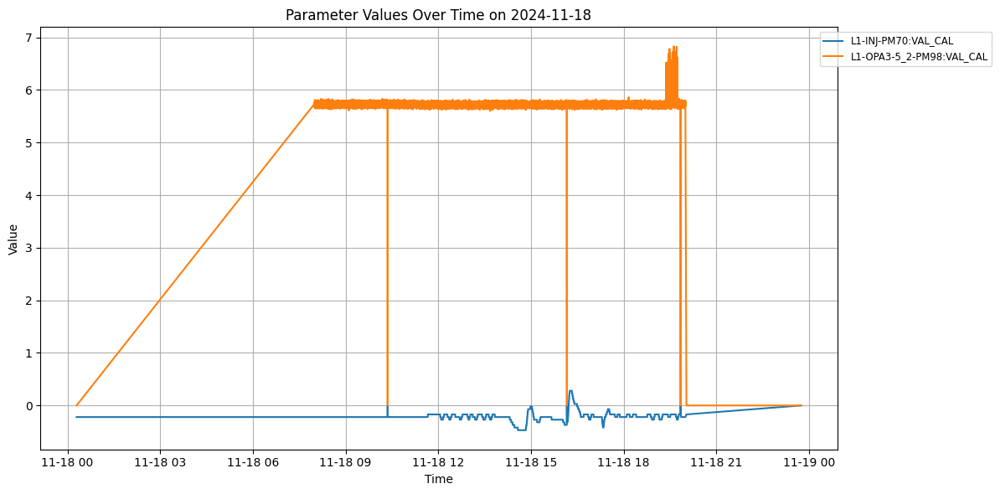

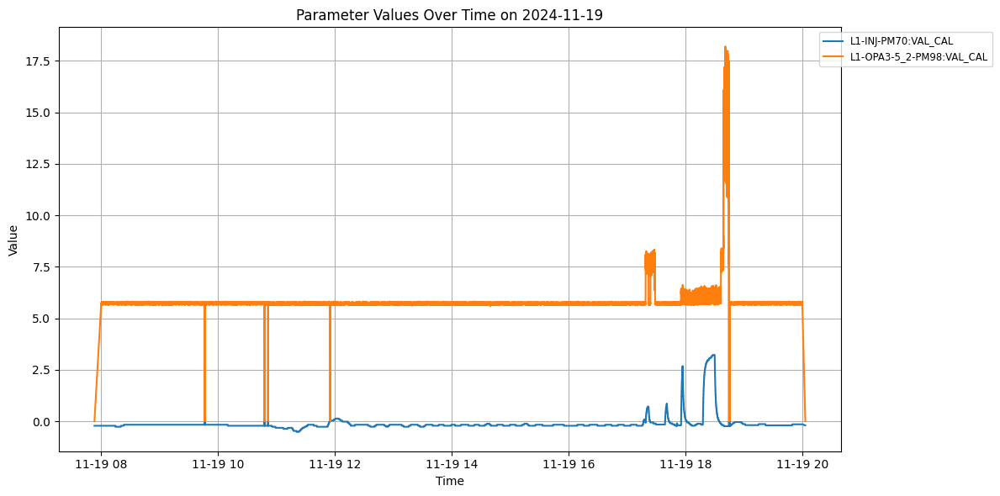

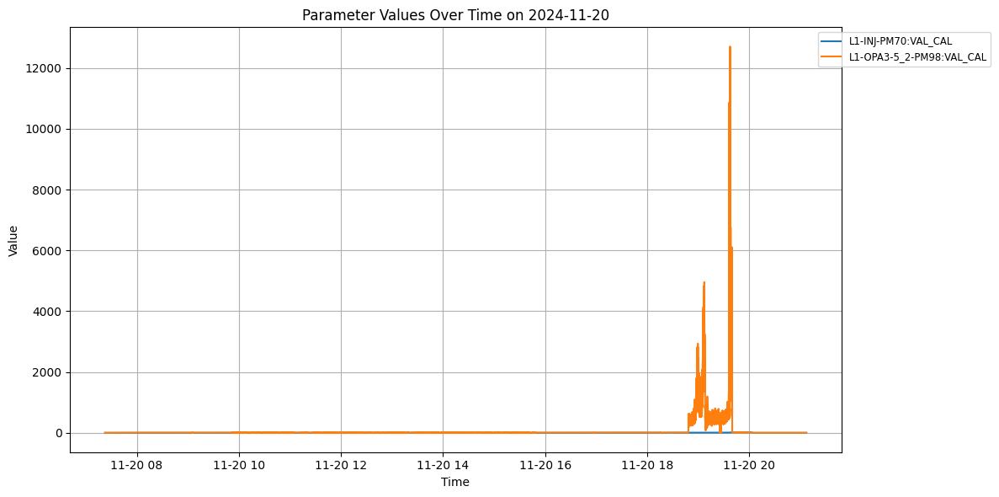

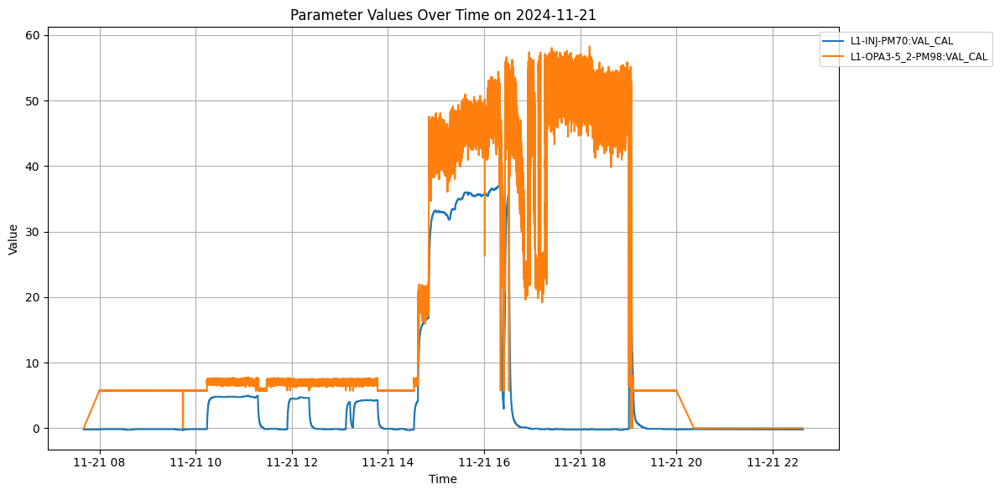

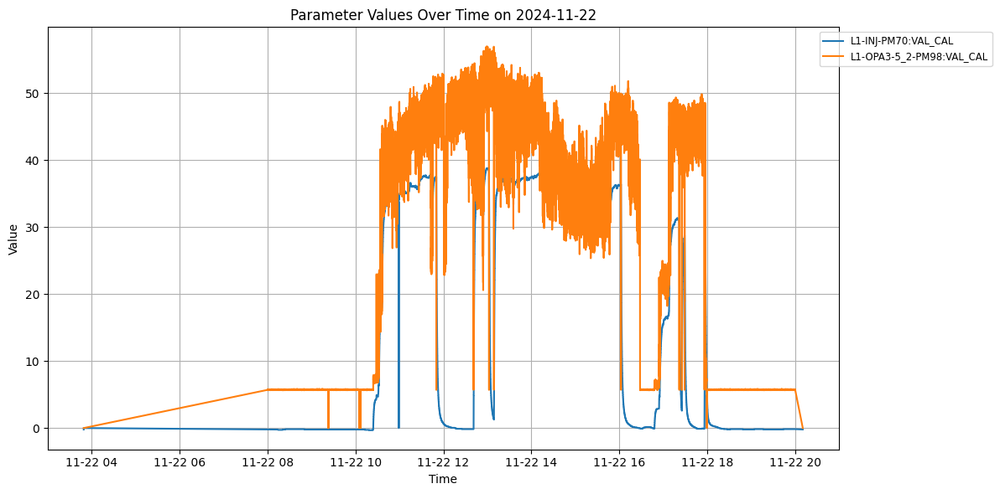

...

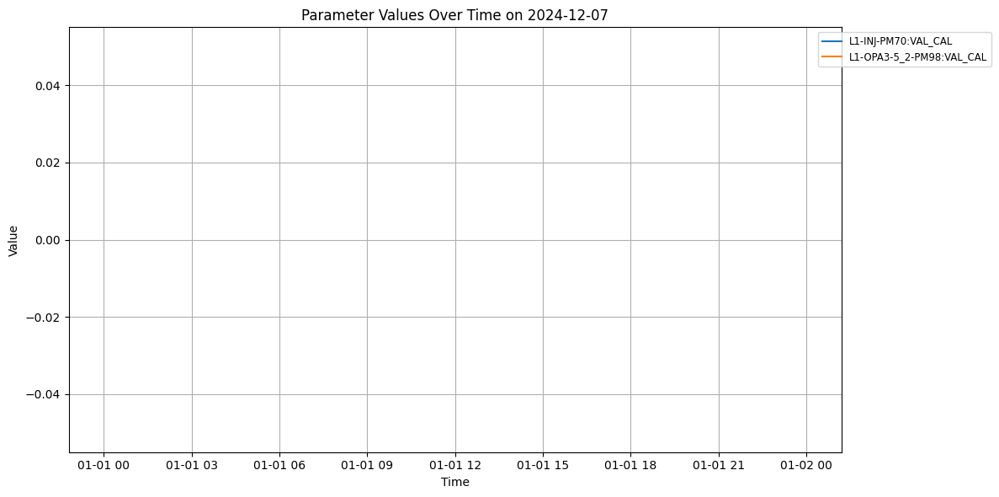

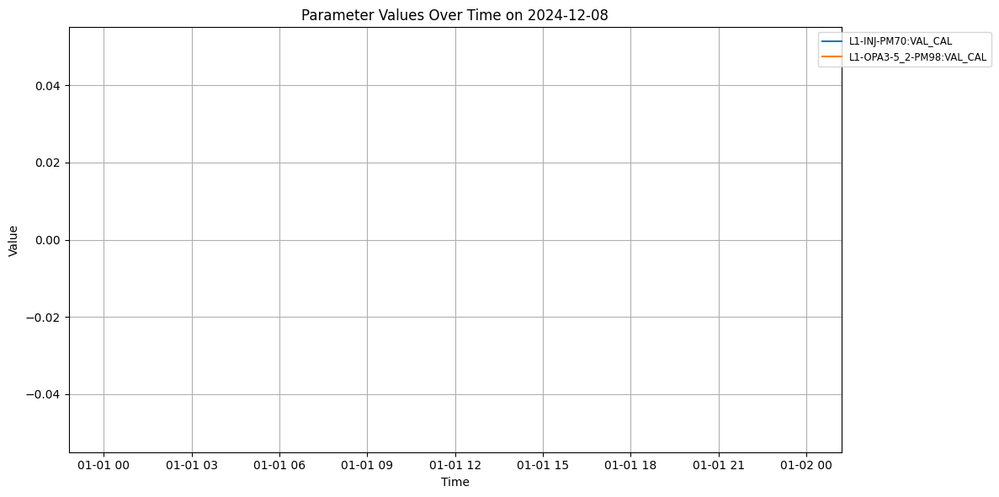

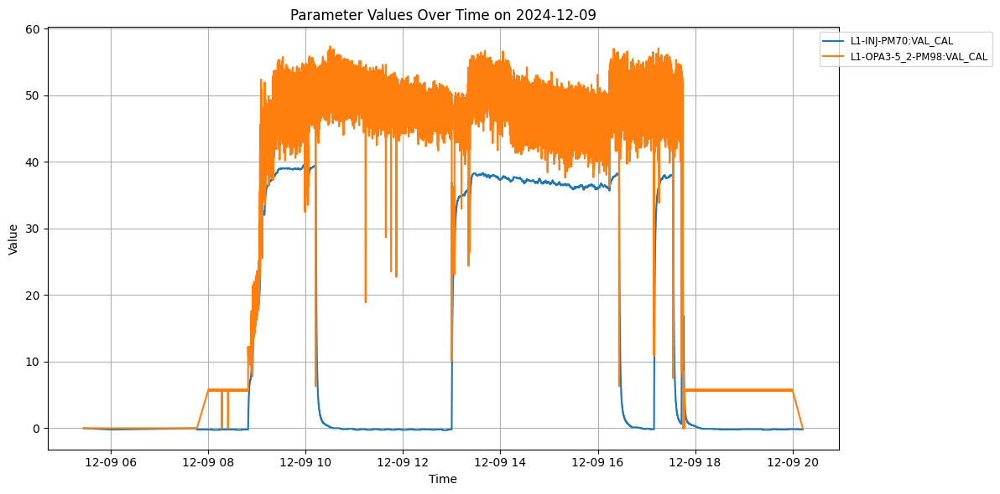

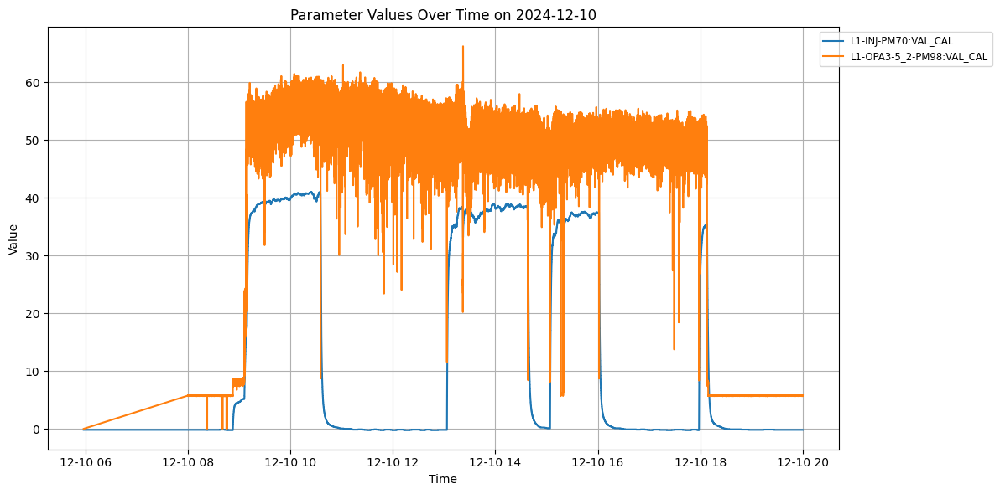

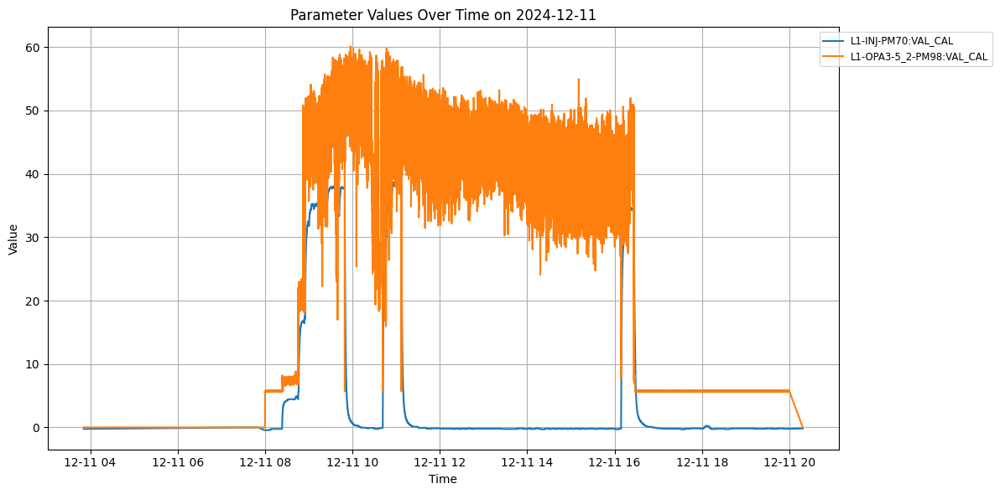

In [39]:
for date in pd.date_range(start=start_date, end=end_date, freq="D"):

    daily_data = filtered_data[filtered_data["Time"].dt.date == date.date()]
    
    daily_data_clean = daily_data.copy(deep=True)
    daily_data_clean[parameters_to_plot_1] = daily_data_clean[parameters_to_plot_1].fillna(0)

    plt.figure(figsize=(12, 6))
    
    for param in parameters_to_plot_1:
        plt.plot(daily_data_clean["Time"], daily_data_clean[param], linestyle='-', label=param)

    plt.title(f"Parameter Values Over Time on {date.strftime('%Y-%m-%d')}")
    plt.xlabel("Time")
    plt.ylabel("Value")
    plt.legend(loc="upper right", fontsize="small", bbox_to_anchor=(1.2, 1))
    plt.grid(True)
    plt.tight_layout()
    plt.show()

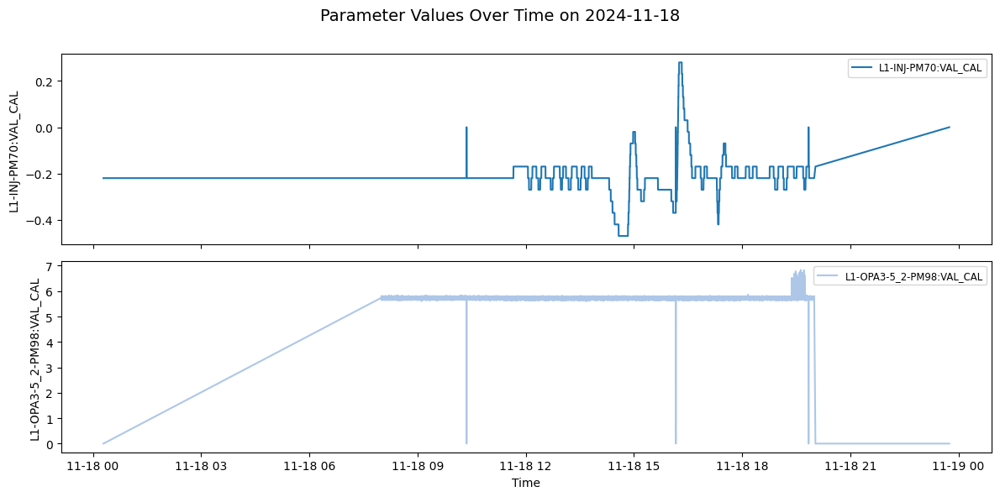

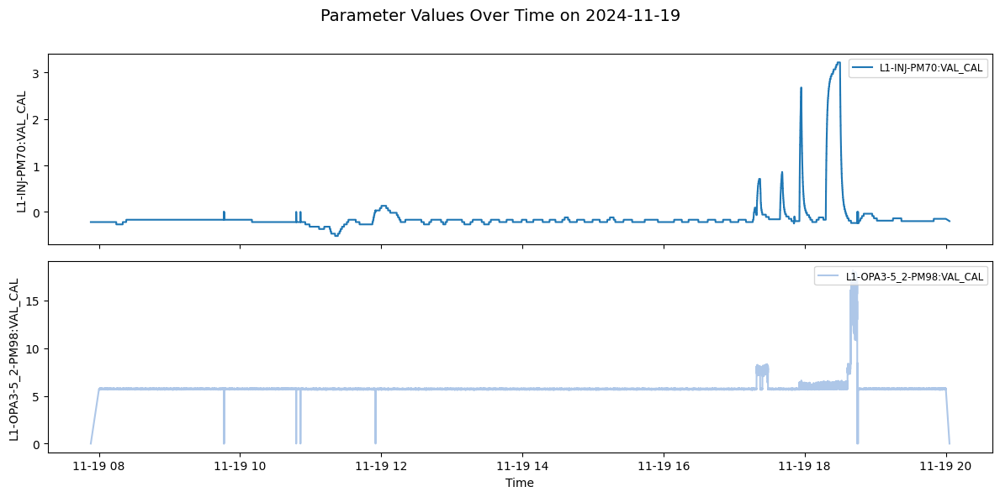

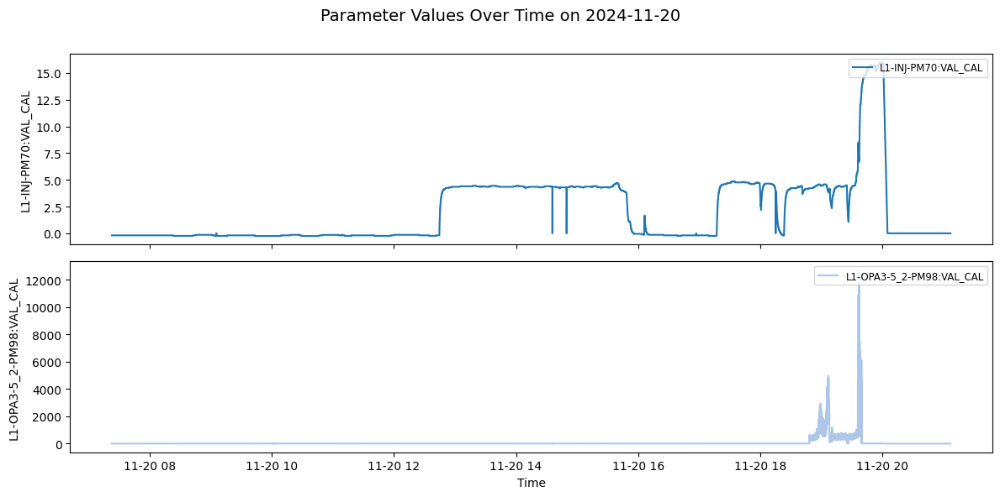

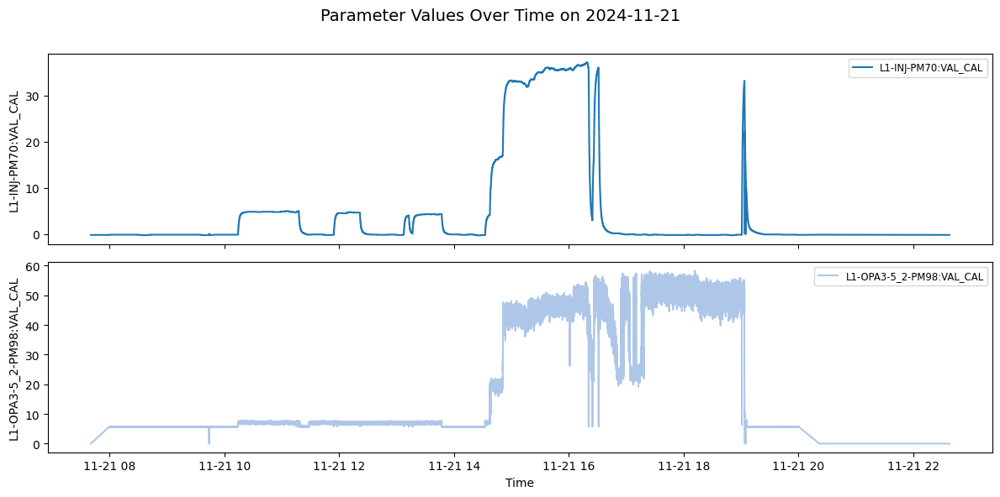

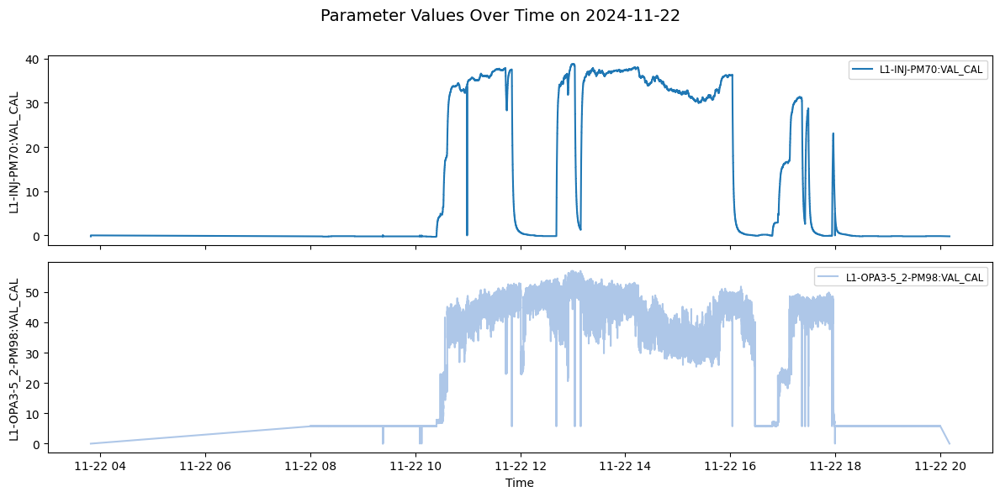

...

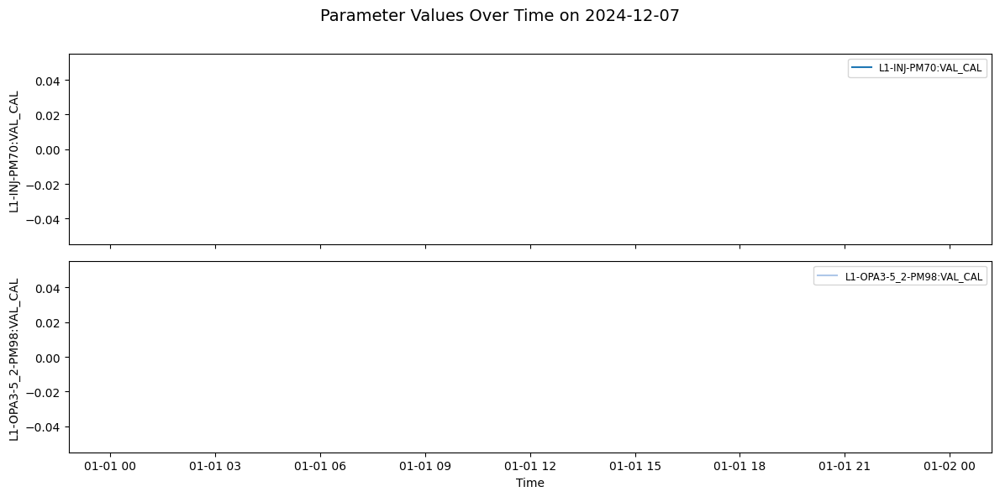

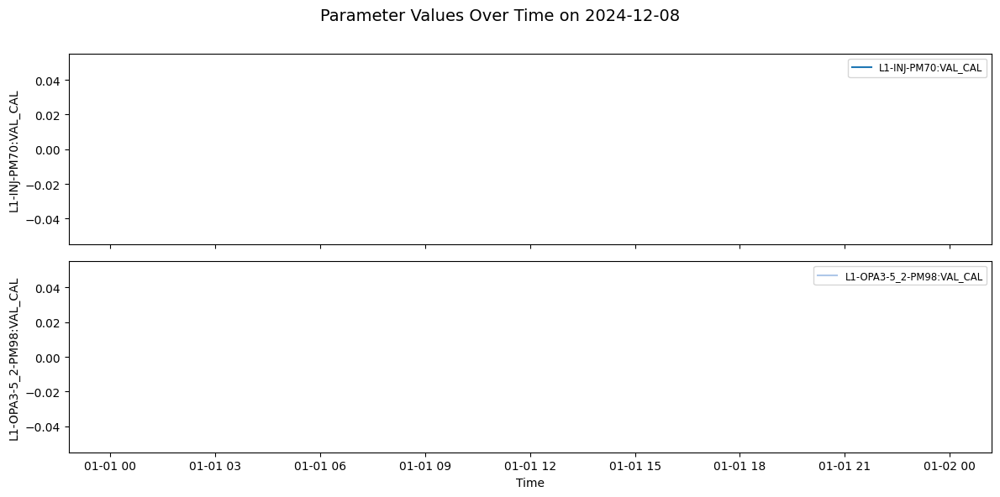

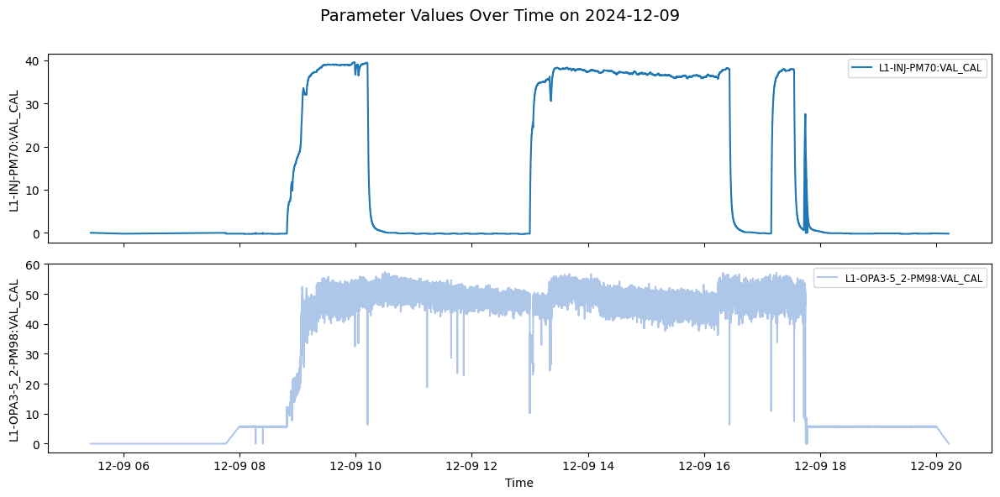

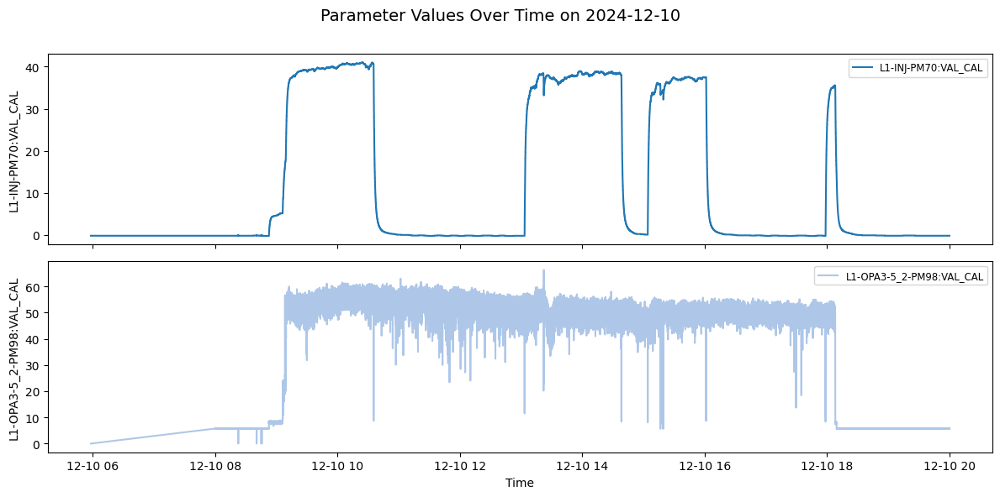

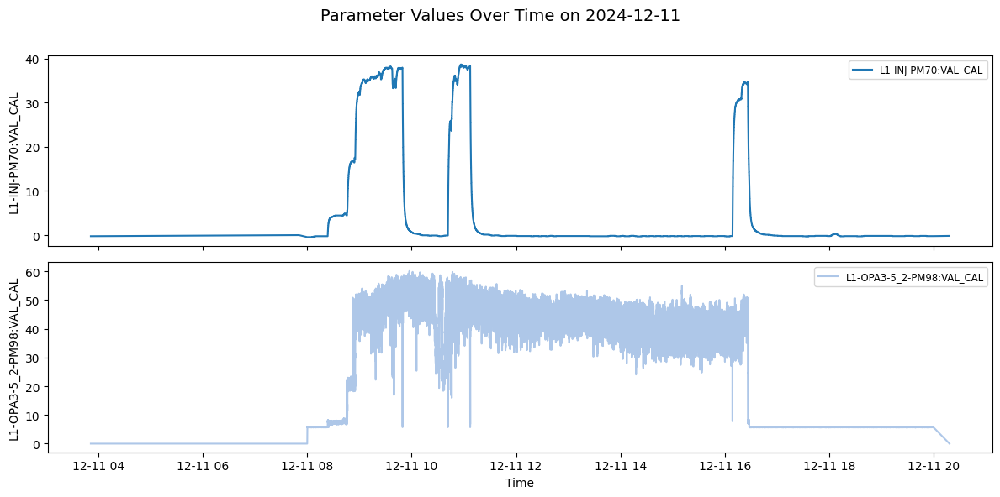

In [43]:
for date in pd.date_range(start=start_date, end=end_date, freq="D"):
    daily_data = filtered_data[filtered_data["Time"].dt.date == date.date()]
    
    # Replace NaN values with 0 in a copy of the daily data
    daily_data_clean = daily_data.copy(deep=True)
    daily_data_clean[parameters_to_plot_1] = daily_data_clean[parameters_to_plot_1].fillna(0)

    fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(12, 6), sharex=True)

    for i, param in enumerate(parameters_to_plot_1):
        axes[i].plot(daily_data_clean["Time"], daily_data_clean[param], linestyle='-', 
                     label=param, color=colors[i])
        axes[i].set_ylabel(param, fontsize=10)
        axes[i].legend(loc="upper right", fontsize="small")

    plt.suptitle(f"Parameter Values Over Time on {date.strftime('%Y-%m-%d')}", fontsize=14)
    axes[-1].set_xlabel("Time")
    plt.tight_layout(rect=[0, 0, 1, 0.97])

    plt.show()

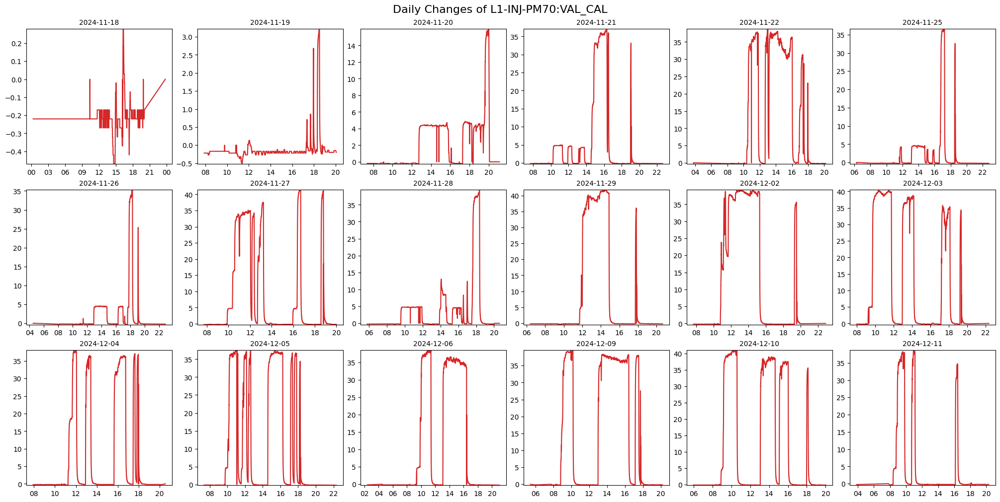

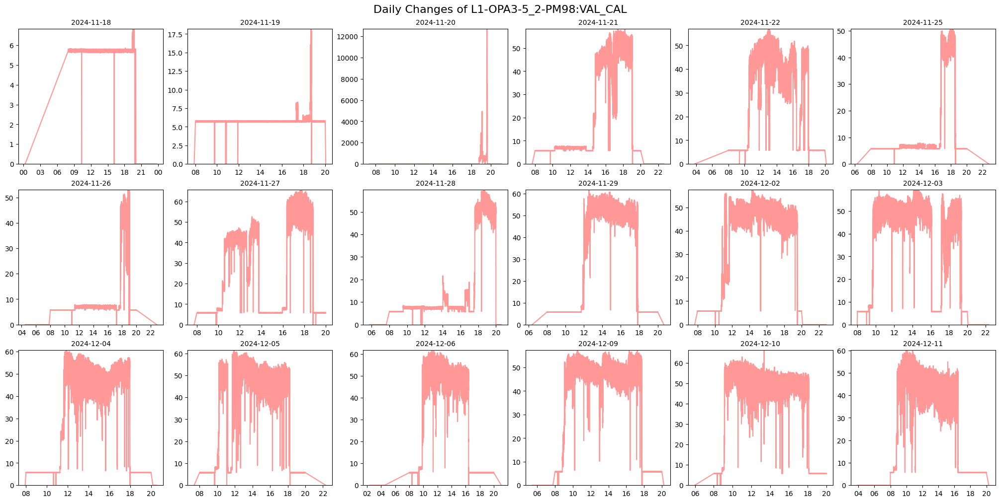

In [44]:
parameters_to_plot_1 = [
    "L1-INJ-PM70:VAL_CAL",
    "L1-OPA3-5_2-PM98:VAL_CAL"
]

n_rows, n_cols = 3, 6  

for param_idx, param in enumerate(parameters_to_plot_1):
    fig, axes = plt.subplots(nrows=n_rows, 
                             ncols=n_cols, 
                             figsize=(20, 10), 
                             sharey=False,  
                             constrained_layout=True)
    axes = axes.flatten()  

    for day_idx, date in enumerate(unique_dates):
        if day_idx >= len(axes):
            break

        # Filter data for the specific date
        daily_data = filtered_data[filtered_data["Time"].dt.date == date.date()]
        
        # Replace NaN values with 0 in a copy of the daily data
        daily_data_clean = daily_data.copy()
        daily_data_clean[param] = daily_data_clean[param].fillna(0)

        # Plot the data
        axes[day_idx].plot(daily_data_clean["Time"], daily_data_clean[param], linestyle='-', 
                           color=colors[param_idx+4], label=f"{param}")

        # Set title for the subplot
        axes[day_idx].set_title(date.strftime('%Y-%m-%d'), fontsize=10)

        # Format x-axis to show only hours
        axes[day_idx].xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter('%H')) 
        axes[day_idx].tick_params(axis='x', rotation=0)  

        # Dynamically adjust y-axis limits based on min/max values of the day's data
        if not daily_data_clean[param].empty:
            min_val = daily_data_clean[param].min()
            max_val = daily_data_clean[param].max()
            axes[day_idx].set_ylim(min_val, max_val)

    # Remove any extra subplots if there are fewer days than subplot slots
    for extra_idx in range(len(unique_dates), len(axes)):
        fig.delaxes(axes[extra_idx])

    # Set a title for the whole figure
    plt.suptitle(f"Daily Changes of {param}", fontsize=16)  

    # Show the figure
    plt.show()


In [50]:
stats = parameters.drop(columns=["Time"]).agg(['min', 'max', 'mean', 'median', 'var'])

print(stats)

        L1-PL3-PZM52:Setpoint  L1-PL3-PZM53:Setpoint  L1-PL3-PZM56:Setpoint  \
min                 -3.000000              -3.000000              -1.859100   
max                  3.000000               3.000000               0.834500   
mean                -0.359617              -0.177593              -0.433875   
median              -0.454300              -0.075900              -0.426500   
var                  0.120623               0.181593               0.165847   

        L1-PL3-PZM57:Setpoint  L1-PL3-PZM58:Setpoint  L1-PL3-PZM59:Setpoint  \
min                 -3.707200              -3.000000              -3.000000   
max                 -0.017700               1.000000               1.000000   
mean                -1.459494              -1.025525              -0.987541   
median              -1.459000              -1.000000              -1.000000   
var                  0.222518               0.618515               0.459875   

        L1-PL5-DIRA3:Piezo1_X_RB  L1-PL5-DIRA3:Pie

# Check NaN values

In [53]:
nan_count = parameters.isna().sum()
nan_percentage = (parameters.isna().mean() * 100).round(2)

# Total number of NaN values in the dataset
total_nan = parameters.isna().sum().sum()

nan_stats = pd.DataFrame({'NaN Count': nan_count, 'NaN Percentage': nan_percentage})
print(f"Total NaN values in the dataset: {total_nan}")
print("\nNaN Statistics per Column:")
print(nan_stats)

Total NaN values in the dataset: 708473

NaN Statistics per Column:
                          NaN Count  NaN Percentage
Time                              0            0.00
L1-PL3-PZM52:Setpoint           205            0.00
L1-PL3-PZM53:Setpoint           209            0.00
L1-PL3-PZM56:Setpoint         49427            1.12
L1-PL3-PZM57:Setpoint         49433            1.12
L1-PL3-PZM58:Setpoint         49453            1.12
L1-PL3-PZM59:Setpoint         49464            1.12
L1-PL5-DIRA3:Piezo1_X_RB        104            0.00
L1-PL5-DIRA3:Piezo1_Y_RB        104            0.00
L1-PL5-DIRA3:Piezo3_X_RB        104            0.00
L1-PL5-DIRA3:Piezo3_Y_RB        104            0.00
L1-PL4-PZM66:Setpoint        127226            2.89
L1-PL4-PZM67:Setpoint        127290            2.89
L1-PL4-PZM68:Setpoint        127308            2.89
L1-PL4-PZM69:Setpoint        127316            2.89
L1-INJ-PM70:VAL_CAL             329            0.01
L1-OPA3-5_2-PM98:VAL_CAL        397            0

In [54]:
parameters.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4400797 entries, 0 to 4400796
Data columns (total 17 columns):
 #   Column                    Dtype         
---  ------                    -----         
 0   Time                      datetime64[ns]
 1   L1-PL3-PZM52:Setpoint     float64       
 2   L1-PL3-PZM53:Setpoint     float64       
 3   L1-PL3-PZM56:Setpoint     float64       
 4   L1-PL3-PZM57:Setpoint     float64       
 5   L1-PL3-PZM58:Setpoint     float64       
 6   L1-PL3-PZM59:Setpoint     float64       
 7   L1-PL5-DIRA3:Piezo1_X_RB  float64       
 8   L1-PL5-DIRA3:Piezo1_Y_RB  float64       
 9   L1-PL5-DIRA3:Piezo3_X_RB  float64       
 10  L1-PL5-DIRA3:Piezo3_Y_RB  float64       
 11  L1-PL4-PZM66:Setpoint     float64       
 12  L1-PL4-PZM67:Setpoint     float64       
 13  L1-PL4-PZM68:Setpoint     float64       
 14  L1-PL4-PZM69:Setpoint     float64       
 15  L1-INJ-PM70:VAL_CAL       float64       
 16  L1-OPA3-5_2-PM98:VAL_CAL  float64       
dtypes: datet

In [59]:
parameters[parameters.isna().any(axis=1)]

,Time,L1-PL3-PZM52:Setpoint,L1-PL3-PZM53:Setpoint,L1-PL3-PZM56:Setpoint,L1-PL3-PZM57:Setpoint,L1-PL3-PZM58:Setpoint,L1-PL3-PZM59:Setpoint,L1-PL5-DIRA3:Piezo1_X_RB,L1-PL5-DIRA3:Piezo1_Y_RB,L1-PL5-DIRA3:Piezo3_X_RB,L1-PL5-DIRA3:Piezo3_Y_RB,L1-PL4-PZM66:Setpoint,L1-PL4-PZM67:Setpoint,L1-PL4-PZM68:Setpoint,L1-PL4-PZM69:Setpoint,L1-INJ-PM70:VAL_CAL,L1-OPA3-5_2-PM98:VAL_CAL
0,2024-11-14 18:01:24.490070820,NaN,0.5890,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2024-11-14 18:01:24.585421085,0.1621,0.5890,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2024-11-14 18:01:29.786182404,0.1621,0.5890,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.9428,NaN,NaN,NaN,NaN
3,2024-11-14 18:01:46.486213207,0.1621,0.5890,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.1545,-1.9428,NaN,NaN,NaN,NaN
4,2024-11-14 18:01:46.489224434,0.1621,0.5890,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.1545,-1.9428,-2.6935,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4400792,2024-12-16 13:17:22.463372231,-0.5754,-0.0728,NaN,NaN,NaN,NaN,NaN,0.7734,0.0382,-0.2856,NaN,NaN,NaN,NaN,NaN,NaN
4400793,2024-12-16 13:17:22.463900089,-0.5754,-0.0728,NaN,NaN,NaN,NaN,NaN,NaN,-0.1086,-0.2856,NaN,NaN,NaN,NaN,NaN,NaN
4400794,2024-12-16 13:17:22.464162827,-0.5754,-0.0728,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.8725,NaN,NaN,NaN,NaN,NaN,NaN
4400795,2025-01-16 15:29:29.595927238,3.0000,-0.0728,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [60]:
nan_rows = parameters[parameters.isna().any(axis=1)]
nan_rows['Hour'] = nan_rows['Time'].dt.hour
nan_hourly_distribution = nan_rows.groupby('Hour').size()

print(nan_hourly_distribution)

Hour
0         1
1         1
2         1
3         3
4         7
5         7
6         5
7        60
8     18860
9     74884
10    47440
11    33246
13        9
14      114
15        3
16       12
17       27
18       37
19     1953
20       44
21       11
22        6
23        5
dtype: int64


/tmp/ipykernel_2496981/996191650.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nan_rows['Hour'] = nan_rows['Time'].dt.hour


# Drop columns

In [61]:
columns_to_drop = [
    "L1-PL5-DIRA3:Piezo1_X_RB",
    "L1-PL5-DIRA3:Piezo1_Y_RB",
    "L1-PL5-DIRA3:Piezo3_X_RB",
    "L1-PL5-DIRA3:Piezo3_Y_RB"
]

parameters = parameters.drop(columns=columns_to_drop)
parameters.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4400797 entries, 0 to 4400796
Data columns (total 13 columns):
 #   Column                    Dtype         
---  ------                    -----         
 0   Time                      datetime64[ns]
 1   L1-PL3-PZM52:Setpoint     float64       
 2   L1-PL3-PZM53:Setpoint     float64       
 3   L1-PL3-PZM56:Setpoint     float64       
 4   L1-PL3-PZM57:Setpoint     float64       
 5   L1-PL3-PZM58:Setpoint     float64       
 6   L1-PL3-PZM59:Setpoint     float64       
 7   L1-PL4-PZM66:Setpoint     float64       
 8   L1-PL4-PZM67:Setpoint     float64       
 9   L1-PL4-PZM68:Setpoint     float64       
 10  L1-PL4-PZM69:Setpoint     float64       
 11  L1-INJ-PM70:VAL_CAL       float64       
 12  L1-OPA3-5_2-PM98:VAL_CAL  float64       
dtypes: datetime64[ns](1), float64(12)
memory usage: 436.5 MB


# Check NaN values again

In [63]:
parameters[parameters.isna().any(axis=1)]

,Time,L1-PL3-PZM52:Setpoint,L1-PL3-PZM53:Setpoint,L1-PL3-PZM56:Setpoint,L1-PL3-PZM57:Setpoint,L1-PL3-PZM58:Setpoint,L1-PL3-PZM59:Setpoint,L1-PL4-PZM66:Setpoint,L1-PL4-PZM67:Setpoint,L1-PL4-PZM68:Setpoint,L1-PL4-PZM69:Setpoint,L1-INJ-PM70:VAL_CAL,L1-OPA3-5_2-PM98:VAL_CAL
0,2024-11-14 18:01:24.490070820,NaN,0.5890,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2024-11-14 18:01:24.585421085,0.1621,0.5890,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2024-11-14 18:01:29.786182404,0.1621,0.5890,NaN,NaN,NaN,NaN,NaN,-1.9428,NaN,NaN,NaN,NaN
3,2024-11-14 18:01:46.486213207,0.1621,0.5890,NaN,NaN,NaN,NaN,-1.1545,-1.9428,NaN,NaN,NaN,NaN
4,2024-11-14 18:01:46.489224434,0.1621,0.5890,NaN,NaN,NaN,NaN,-1.1545,-1.9428,-2.6935,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4400792,2024-12-16 13:17:22.463372231,-0.5754,-0.0728,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4400793,2024-12-16 13:17:22.463900089,-0.5754,-0.0728,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4400794,2024-12-16 13:17:22.464162827,-0.5754,-0.0728,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4400795,2025-01-16 15:29:29.595927238,3.0000,-0.0728,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [64]:
nan_rows = parameters[parameters.isna().any(axis=1)]
nan_rows['Hour'] = nan_rows['Time'].dt.hour
nan_hourly_distribution = nan_rows.groupby('Hour').size()

print(nan_hourly_distribution)

Hour
0         1
1         1
2         1
3         3
4         7
5         7
6         5
7        60
8     18860
9     74884
10    47440
11    33246
13        9
14      114
15        3
16       12
17       27
18       37
19     1953
20       44
21       11
22        6
23        5
dtype: int64


/tmp/ipykernel_2496981/517220807.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nan_rows['Hour'] = nan_rows['Time'].dt.hour


# Save dataset

In [65]:
parameters.to_csv("../data/parameters_data.csv", index=False)